In [1]:
from astropy.io import fits
from astropy import units, constants
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import corner
from voigt_fit_lib import *
import os
import pickle

Load in the files

In [2]:
rootdir = '/Users/thepoetoftwilight/Documents/CUBS/Data/PG1522+101/'

First, the FUV files

In [3]:
spec_fits_fuv = fits.open(rootdir + 'FUV/PG1522+101_FUV_wavecal_new.fits')
nodes_fits_fuv = fits.open(rootdir + 'FUV/PG1522+101_FUV_wavecal_new_nodes.fits')
ids_fits_fuv = fits.open(rootdir + 'FUV/PG1522+101_FUV_wavecal_new_identifications.fits')
lsf_fits_fuv = fits.open(rootdir + 'FUV/PG1522_COS_FUV_wavcal2022_lsf_ZQ.fits')

Then, the NUV files

In [4]:
spec_fits_nuv = fits.open(rootdir + 'G185M/PG1522+101_NUV_wavecal_new.fits')
nodes_fits_nuv = fits.open(rootdir + 'G185M/PG1522+101_NUV_wavecal_new_nodes.fits')
ids_fits_nuv = fits.open(rootdir + 'G185M/PG1522+101_NUV_wavecal_new_identifications.fits')
lsf_fits_nuv = fits.open(rootdir + 'G185M/PG1522_COS_NUV_wavcal2022_lsf.fits')

Then, the STIS files

In [5]:
spec_fits_stis = fits.open(rootdir + 'STIS/PG1522+101_E230M_new.fits')
nodes_fits_stis = fits.open(rootdir + 'STIS/PG1522+101_E230M_new_nodes.fits')
ids_fits_stis = fits.open(rootdir + 'STIS/PG1522+101_E230M_new_identifications.fits')
lsf_fits_stis = fits.open(rootdir + 'STIS/PG1522_STIS_NUV_wavcal2022_lsf.fits')

Compile a list of the spectra, continuum nodes, and IDs for all detectors

In [6]:
spec_fits_list = [spec_fits_fuv, spec_fits_nuv, spec_fits_stis]
nodes_fits_list = [nodes_fits_fuv, nodes_fits_nuv, nodes_fits_stis]
ids_fits_list = [ids_fits_fuv, ids_fits_nuv, ids_fits_stis]
lsf_fits_list = [lsf_fits_fuv, lsf_fits_nuv, lsf_fits_stis]

Load in the ions table for atomic data

In [7]:
atomic_data_table = np.loadtxt('/Users/thepoetoftwilight/Documents/CUBS/pabs0/data/linelists/atom.dat', dtype=str)

# OIII
Get the OIII 702 line in COS FUV

In [8]:
oiii_702_fuv = ion_transition('OIII702', 109, 'FUV')

In [9]:
oiii_702_fuv.grab_ion_transition_info(ids_fits_list, atomic_data_table)

In [10]:
oiii_702_fuv.grab_ion_transition_spec(spec_fits_list, v_range=[-200,200])

In [11]:
oiii_702_fuv.cont_norm_flux(nodes_fits_list, renorm=True, v_abs_range=[-100,100], degree=1)

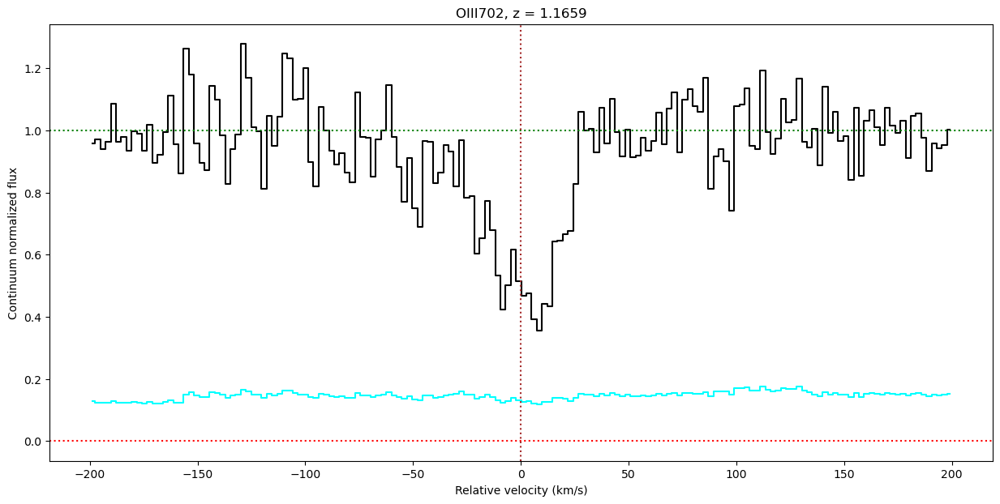

In [12]:
fig, ax = plt.subplots(1, figsize=(15,7))

oiii_702_fuv.plot_ion_transition_spec(ax)

In [13]:
oiii_702_fuv.grab_ion_transition_lsf(lsf_fits_list)

In [14]:
oiii_702_fuv.init_multi_voigt(init_values = np.array([[14.2, 12, 7]]), 
                             lsf_convolve = True)

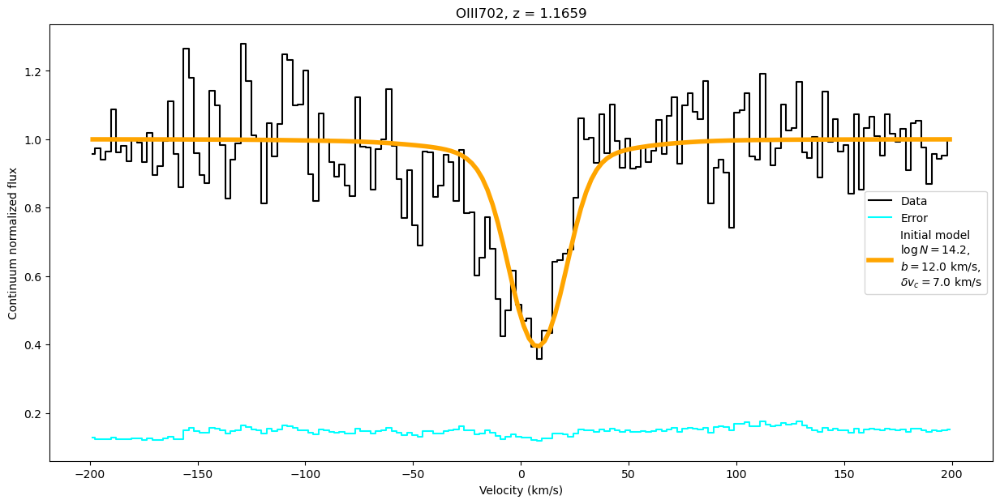

In [15]:
fig, ax = plt.subplots(1, figsize=(15, 7))

oiii_702_fuv.plot_init_profile(ax, legend=True)

In [16]:
oiii_702_fuv.fit_multi_voigt()

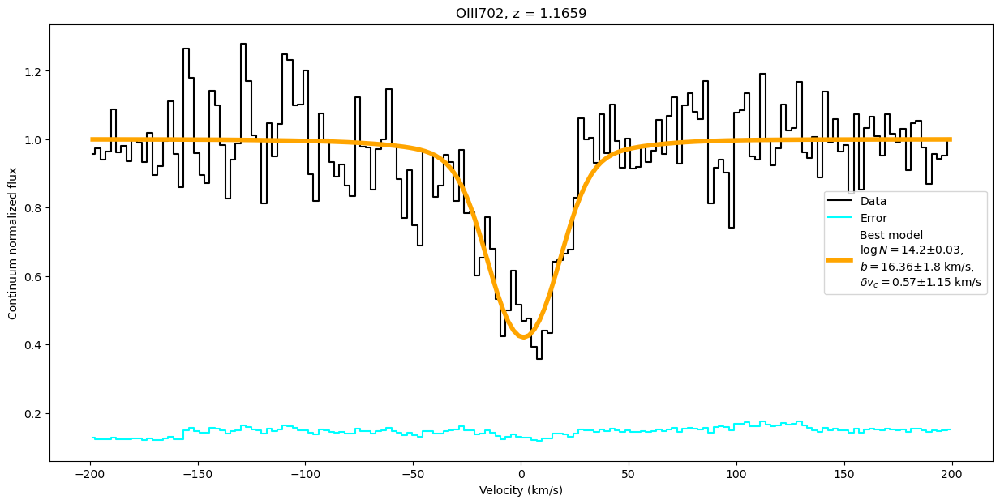

In [17]:
fig, ax = plt.subplots(1, figsize=(15, 7))

oiii_702_fuv.plot_best_profile(ax, legend=True)

Load OIII 832 from COS NUV

In [18]:
oiii_832_nuv = ion_transition('OIII832', 11, 'NUV')

In [19]:
oiii_832_nuv.grab_ion_transition_info(ids_fits_list, atomic_data_table, delta_v=-20)

In [20]:
oiii_832_nuv.grab_ion_transition_spec(spec_fits_list, v_range=[-200,200], masks=[[-110,-35],[30,85]])

In [21]:
oiii_832_nuv.cont_norm_flux(nodes_fits_list, renorm=True, v_abs_range=[-50,50], degree=1)

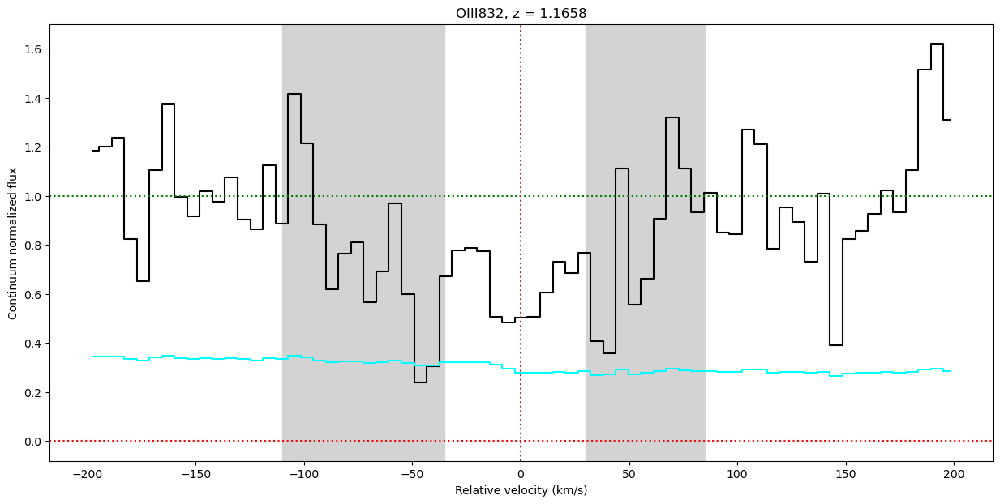

In [22]:
fig, ax = plt.subplots(1, figsize=(15,7))

oiii_832_nuv.plot_ion_transition_spec(ax)

In [23]:
oiii_832_nuv.grab_ion_transition_lsf(lsf_fits_list)

In [24]:
oiii_832_nuv.init_multi_voigt(init_values = np.array([[14.6, 6, 0]]), 
                             lsf_convolve = True)

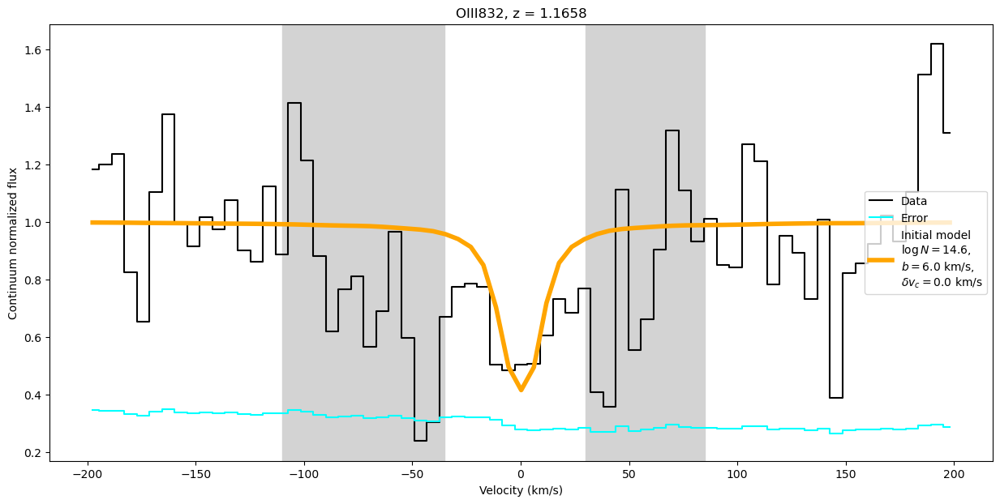

In [25]:
fig, ax = plt.subplots(1, figsize=(15, 7))

oiii_832_nuv.plot_init_profile(ax, legend=True)

In [26]:
oiii_832_nuv.fit_multi_voigt()

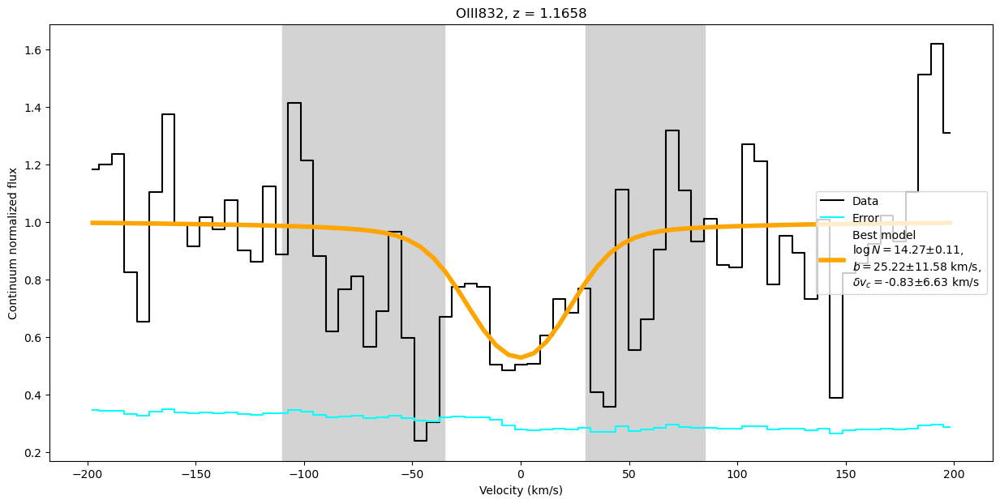

In [27]:
fig, ax = plt.subplots(1, figsize=(15, 7))

oiii_832_nuv.plot_best_profile(ax, legend=True)

Compile the OIII ion

In [28]:
oiii = ion(1.1659, 'OIII_sankar', [oiii_702_fuv, oiii_832_nuv])

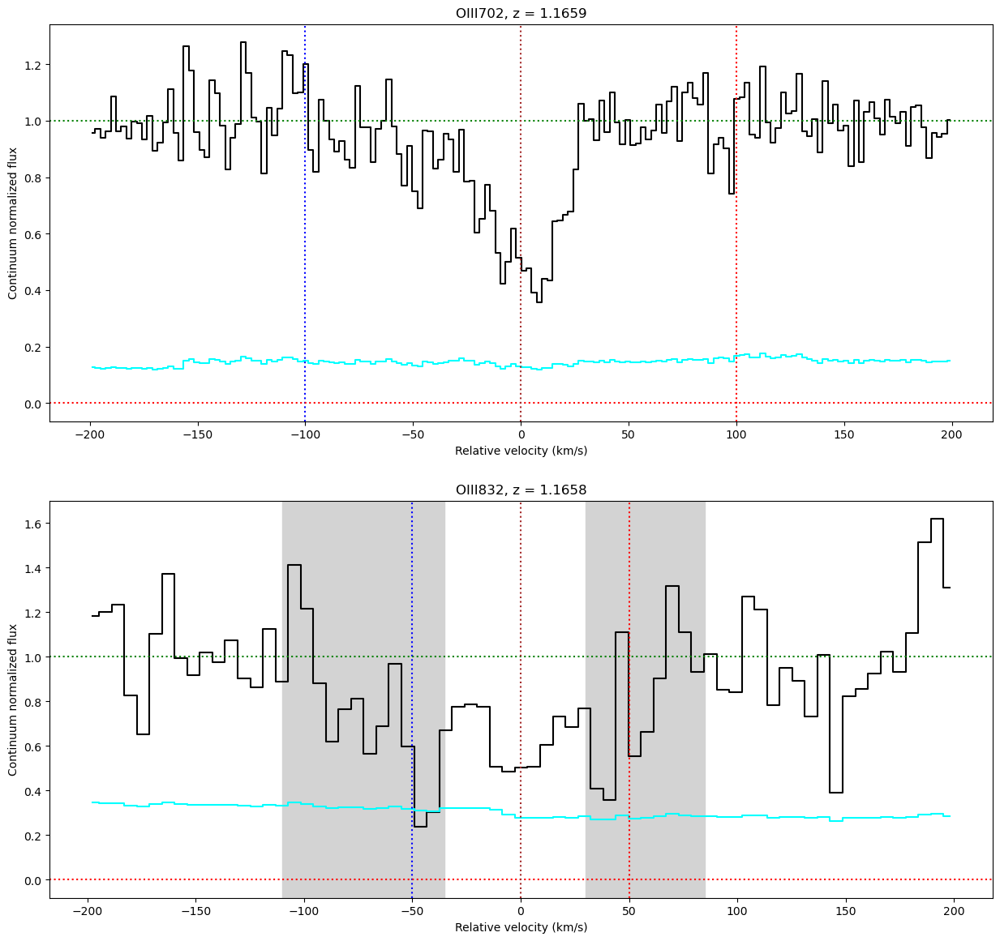

In [29]:
fig, axes = plt.subplots(2, 1, figsize=(15,14))

oiii.plot_ion(axes, draw_cont=True)

In [30]:
oiii.init_ion(np.array([[14.2, 12, 0]]))

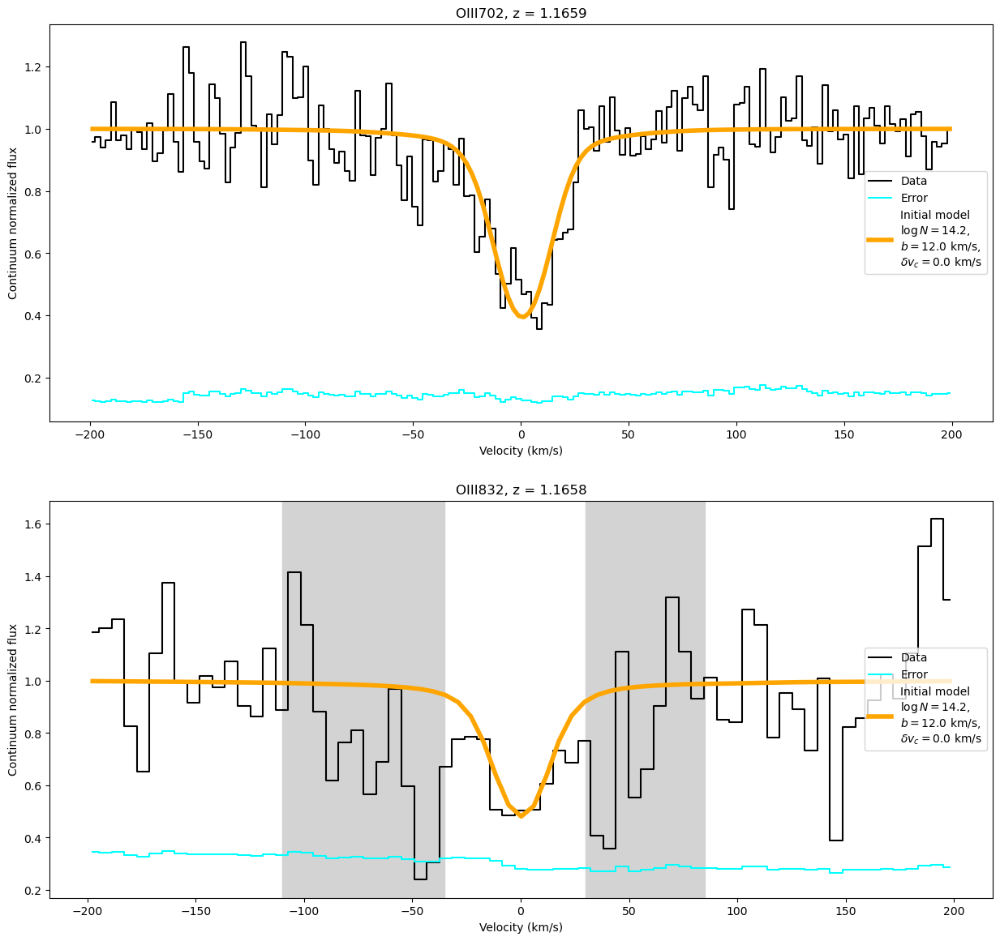

In [31]:
fig, axes = plt.subplots(2, 1, figsize=(15,14))

oiii.plot_ion_init_fit(axes, legend=True)

In [32]:
oiii.fit_ion()

In [33]:
oiii.result

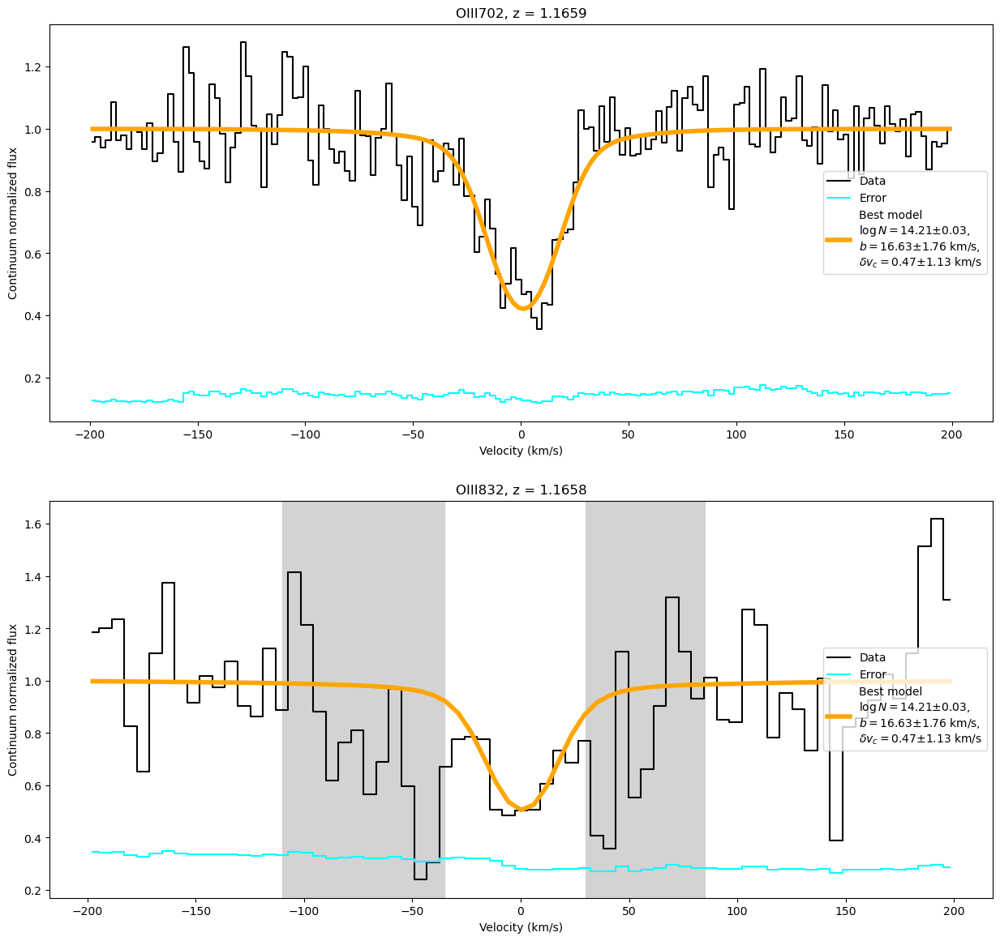

In [34]:
fig, axes = plt.subplots(2, 1, figsize=(15,14))

oiii.plot_ion_best_fit(axes, legend=True)

In [35]:
#oiii.fit_ion_emcee(loaddir=rootdir, n_steps=4000)
oiii.fit_ion_emcee(load=True, loaddir=rootdir)

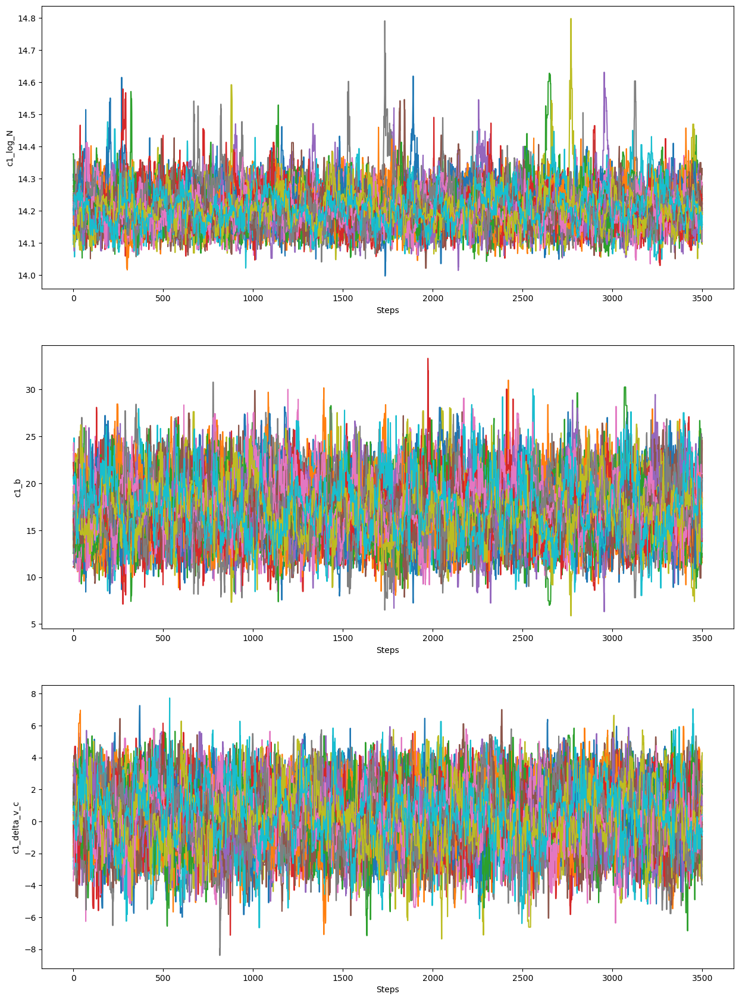

In [36]:
fig, axes = plt.subplots(3, 1, figsize=(15,7*3))

oiii.plot_chains(axes)

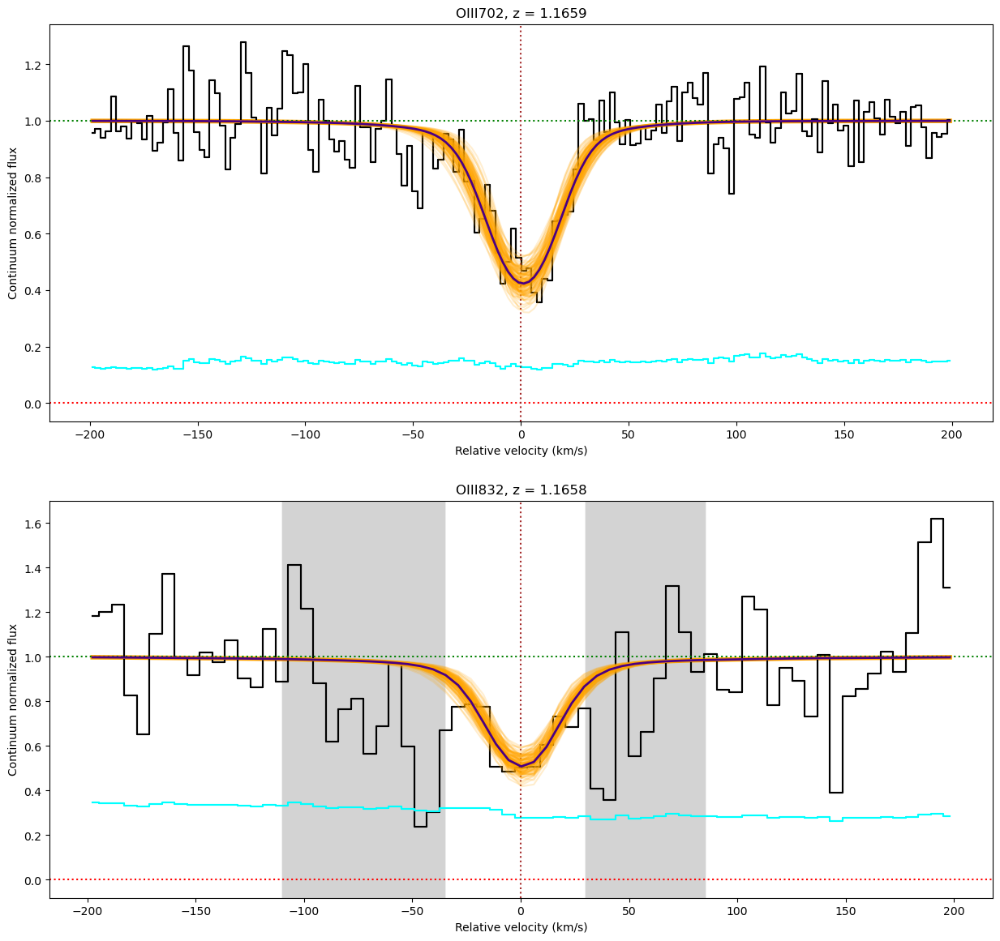

In [37]:
fig, axes = plt.subplots(2, 1, figsize=(15,14))

oiii.plot_ion_best_fit(axes)
oiii.plot_samples(axes)

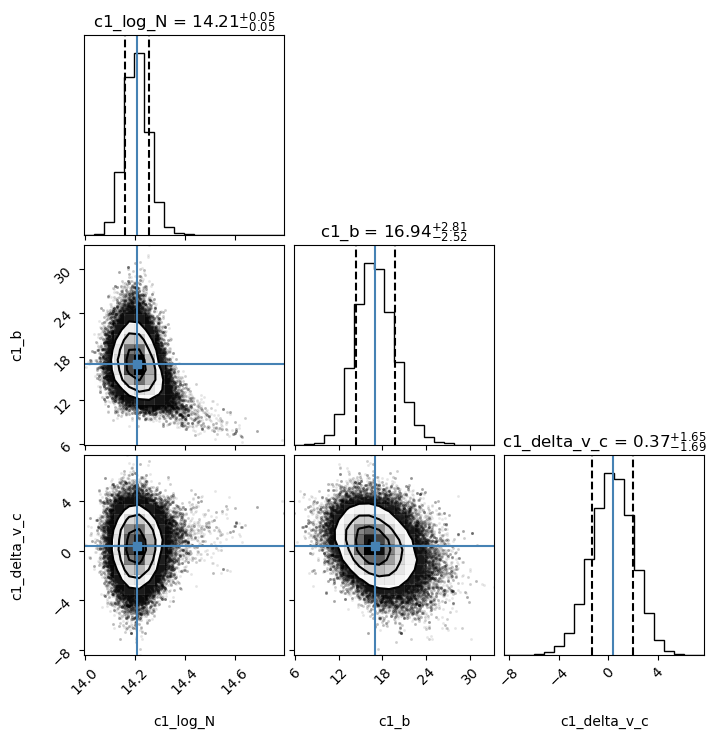

In [38]:
oiii.plot_corner()

# OIV

Begin with OIV 553 in COS FUV

In [39]:
oiv_553_fuv = ion_transition('OIV553', 109, 'FUV')

In [40]:
oiv_553_fuv.grab_ion_transition_info(ids_fits_list, atomic_data_table)

In [41]:
oiv_553_fuv.grab_ion_transition_spec(spec_fits_list, v_range=[-200,200], masks=[[-200,-150],[130,200]])

In [42]:
oiv_553_fuv.cont_norm_flux(nodes_fits_list, renorm=True, v_abs_range=[-70,70], degree=1)

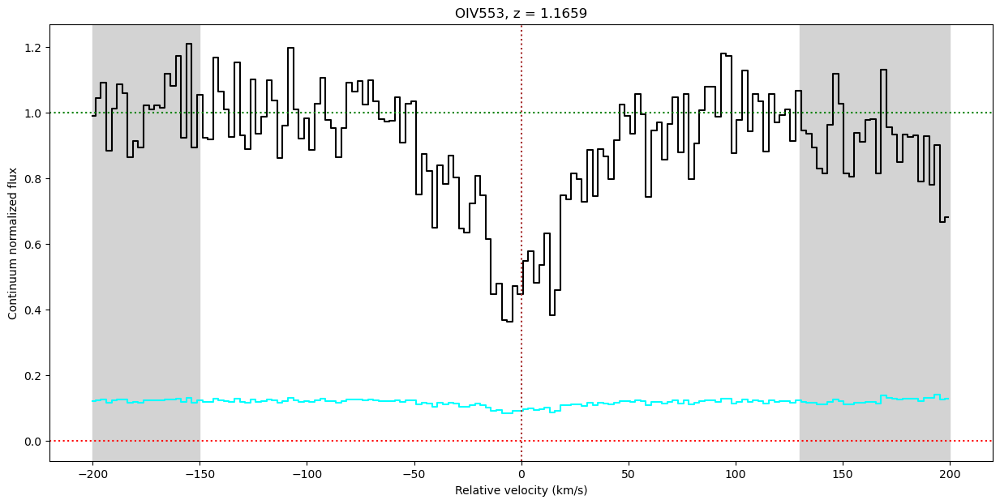

In [43]:
fig, ax = plt.subplots(1, figsize=(15,7))

oiv_553_fuv.plot_ion_transition_spec(ax)

In [44]:
oiv_553_fuv.grab_ion_transition_lsf(lsf_fits_list)

In [45]:
oiv_553_fuv.init_multi_voigt(init_values = np.array([[13.98, 22, -25],
                                                     [14.36, 10, 5]]), 
                             lsf_convolve = True)

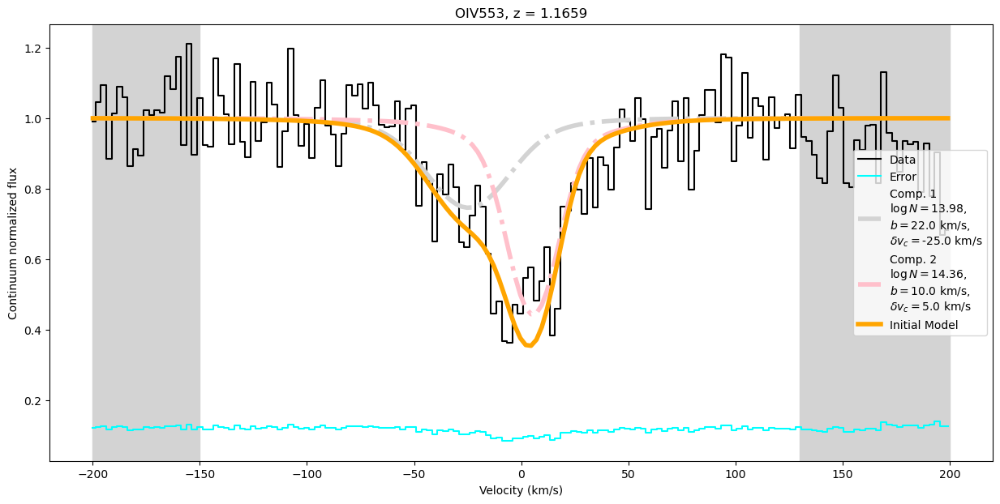

In [46]:
fig, ax = plt.subplots(1, figsize=(15, 7))

oiv_553_fuv.plot_init_profile(ax, legend=True)

In [47]:
oiv_553_fuv.fit_multi_voigt(lower_bounds = {(0,0):13.75, (0,1):20., (0,2):-30.,
                                   (1,0):14., (1,1):8., (1,2):0.},
           upper_bounds = {(0,0):14.2, (0,1):25., (0,2):-25.,
                                   (1,0):14.5, (1,1):12., (1,2):2.})

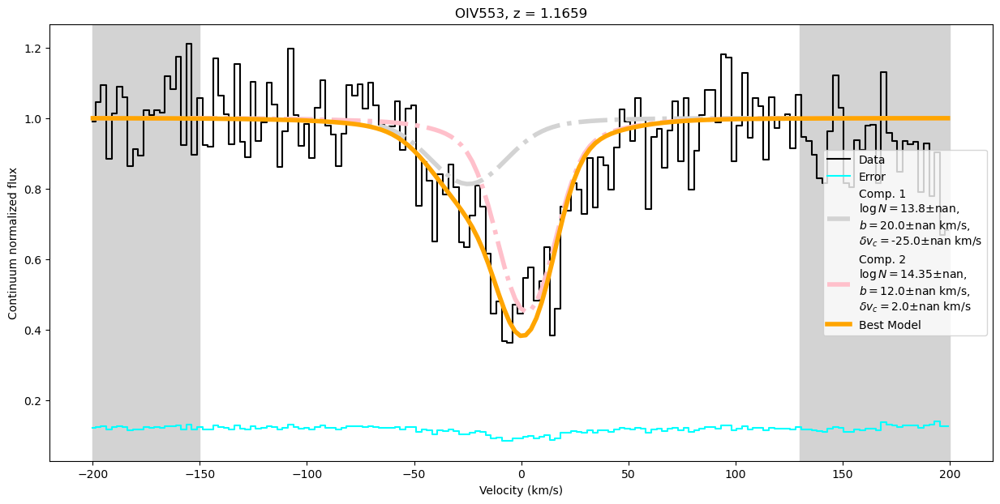

In [48]:
fig, ax = plt.subplots(1, figsize=(15, 7))

oiv_553_fuv.plot_best_profile(ax, legend=True)

Next, do OIV 554 in COS FUV

In [49]:
oiv_554_fuv = ion_transition('OIV554', 109, 'FUV')

In [50]:
oiv_554_fuv.grab_ion_transition_info(ids_fits_list, atomic_data_table, delta_v=30)

In [51]:
oiv_554_fuv.grab_ion_transition_spec(spec_fits_list, v_range=[-200,200], masks=[[-200,-80],[65,200]])

In [52]:
oiv_554_fuv.cont_norm_flux(nodes_fits_list, renorm=True, v_abs_range=[-75,60], degree=1)

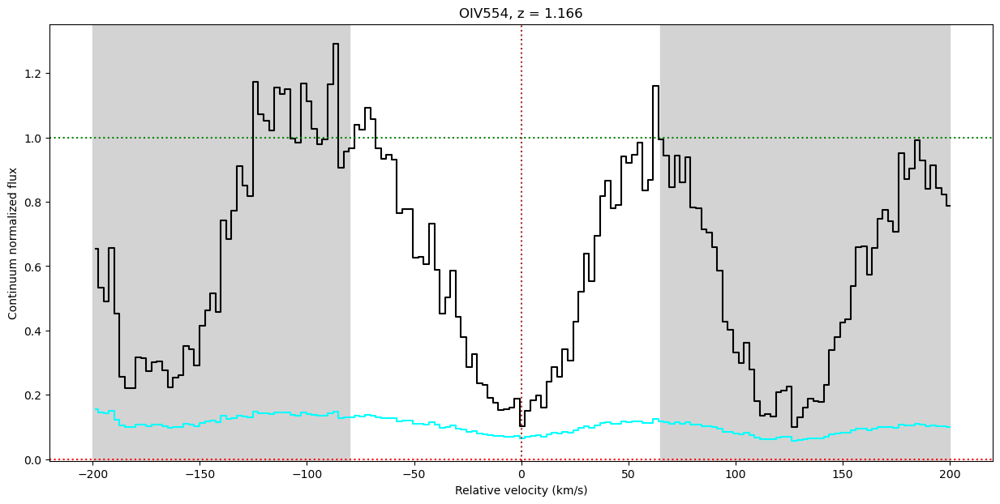

In [53]:
fig, ax = plt.subplots(1, figsize=(15,7))

oiv_554_fuv.plot_ion_transition_spec(ax)

In [54]:
oiv_554_fuv.grab_ion_transition_lsf(lsf_fits_list)

In [55]:
oiv_554_fuv.init_multi_voigt(init_values = np.array([[13.98, 22, -19],
                                                     [14.36, 12 , 16]]), 
                             lsf_convolve = True)

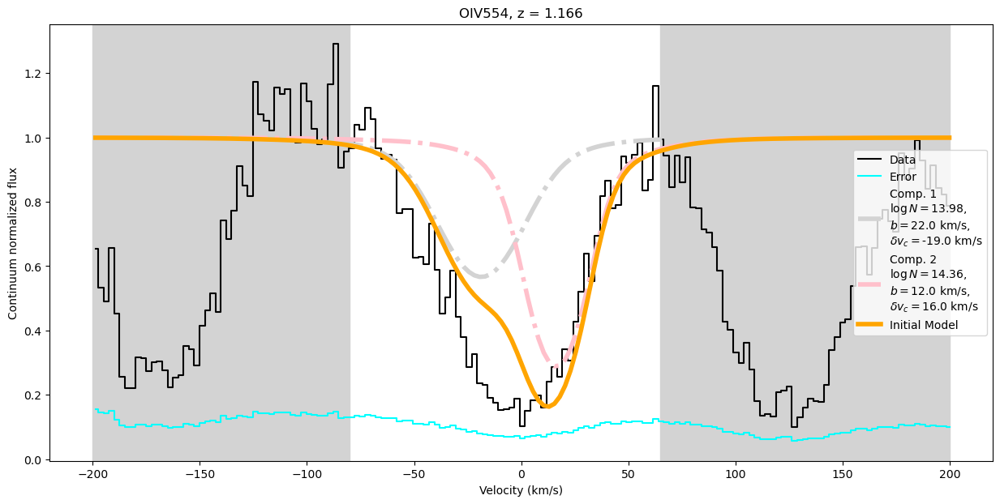

In [56]:
fig, ax = plt.subplots(1, figsize=(15, 7))

oiv_554_fuv.plot_init_profile(ax, legend=True)

In [57]:
#oiv_554_fuv.fit_multi_voigt()

oiv_554_fuv.fit_multi_voigt(lower_bounds = {(0,0):13.75, (0,1):20., (0,2):-30.,
                                   (1,0):14., (1,1):8., (1,2):0.},
           upper_bounds = {(0,0):14.2, (0,1):25., (0,2):-25.,
                                   (1,0):14.5, (1,1):12., (1,2):2.})

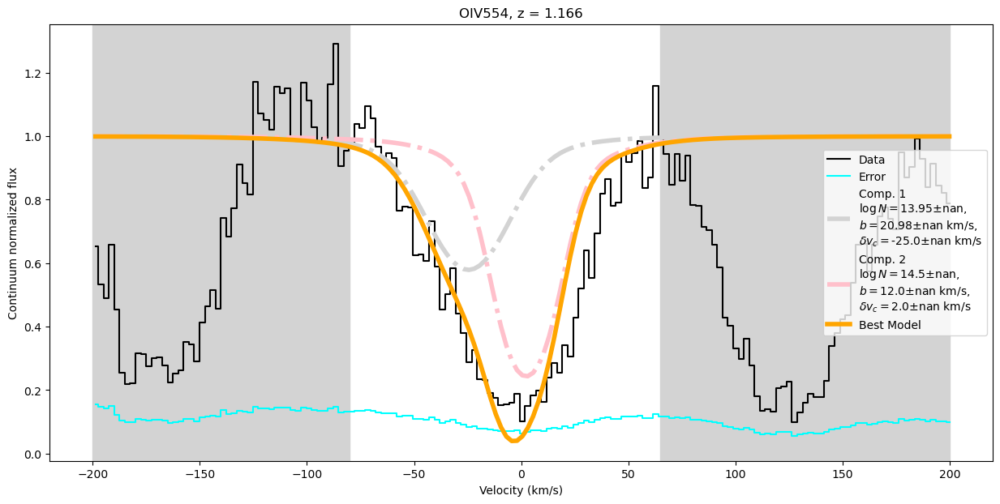

In [58]:
fig, ax = plt.subplots(1, figsize=(15, 7))

oiv_554_fuv.plot_best_profile(ax, legend=True)

Next, OIV 608

In [59]:
oiv_608_fuv = ion_transition('OIV608', 109, 'FUV')

In [60]:
oiv_608_fuv.grab_ion_transition_info(ids_fits_list, atomic_data_table)

In [61]:
oiv_608_fuv.grab_ion_transition_spec(spec_fits_list, v_range=[-200,200], masks=[[-100,-70],
                                                                                [-180,-120],
                                                                               [80,120]])

In [62]:
oiv_608_fuv.cont_norm_flux(nodes_fits_list, renorm=True, v_abs_range=[-75,60], degree=1)

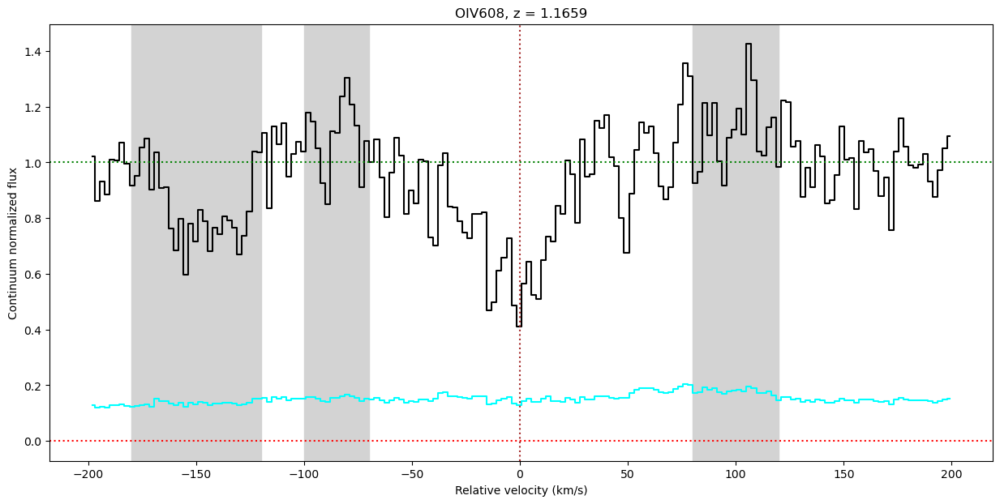

In [63]:
fig, ax = plt.subplots(1, figsize=(15,7))

oiv_608_fuv.plot_ion_transition_spec(ax)

In [64]:
oiv_608_fuv.grab_ion_transition_lsf(lsf_fits_list)

In [65]:
oiv_608_fuv.init_multi_voigt(init_values = np.array([[13.98, 22, -19],
                                                     [14.36, 12 , 9]]), 
                             lsf_convolve = True)

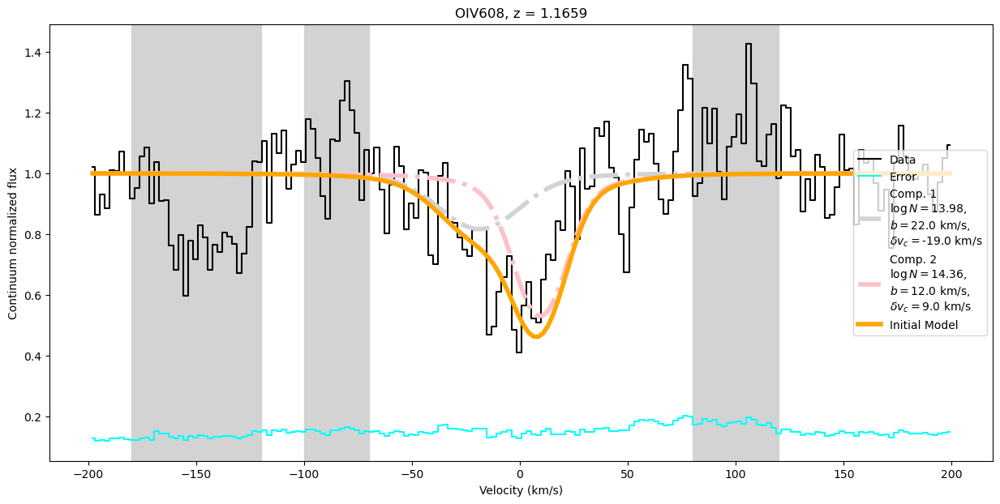

In [66]:
fig, ax = plt.subplots(1, figsize=(15, 7))

oiv_608_fuv.plot_init_profile(ax, legend=True)

In [67]:
#oiv_608_fuv.fit_multi_voigt()

oiv_608_fuv.fit_multi_voigt(lower_bounds = {(0,0):13.75, (0,1):20., (0,2):-30.,
                                   (1,0):14., (1,1):8., (1,2):0.},
           upper_bounds = {(0,0):14.2, (0,1):25., (0,2):-25.,
                                   (1,0):14.5, (1,1):12., (1,2):2.})

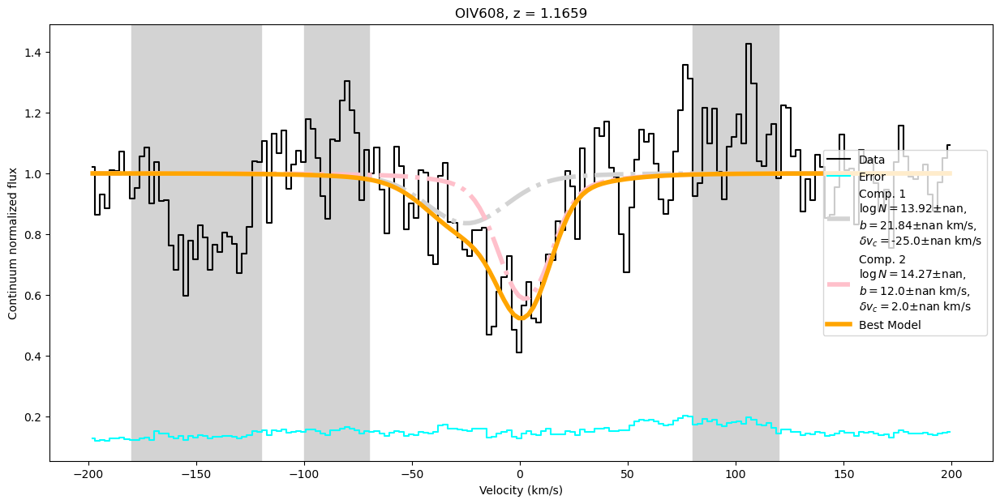

In [68]:
fig, ax = plt.subplots(1, figsize=(15, 7))

oiv_608_fuv.plot_best_profile(ax, legend=True)

Finally, OIV 787

In [69]:
oiv_787_fuv = ion_transition('OIV787', 109, 'FUV')

In [70]:
oiv_787_fuv.grab_ion_transition_info(ids_fits_list, atomic_data_table)

In [71]:
oiv_787_fuv.grab_ion_transition_spec(spec_fits_list, v_range=[-200,200], masks=[[-150,-100],[150,200]])

In [72]:
oiv_787_fuv.cont_norm_flux(nodes_fits_list, renorm=True, v_abs_range=[-75,60], degree=1)

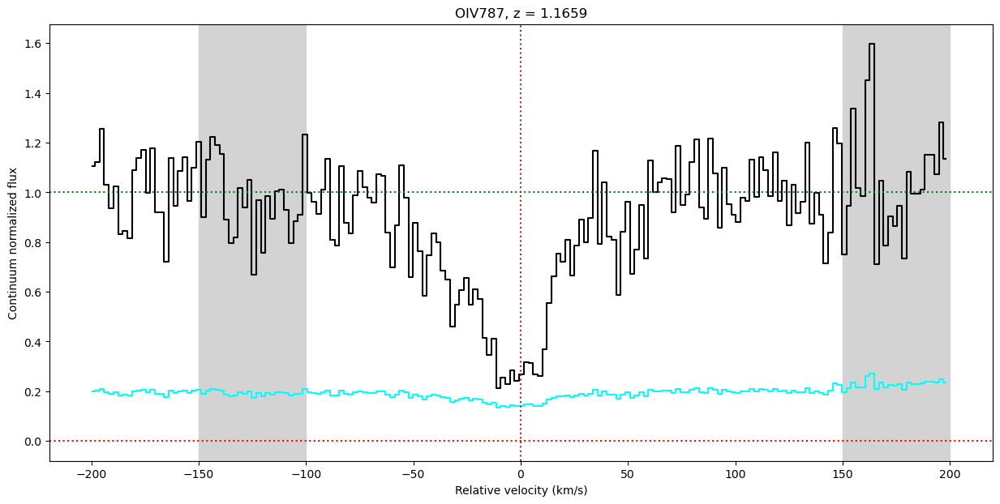

In [73]:
fig, ax = plt.subplots(1, figsize=(15,7))

oiv_787_fuv.plot_ion_transition_spec(ax)

In [74]:
oiv_787_fuv.grab_ion_transition_lsf(lsf_fits_list)

In [75]:
oiv_787_fuv.init_multi_voigt(init_values = np.array([[13.98, 22, -19],
                                                     [14.36, 12 , 9]]), 
                             lsf_convolve = True)

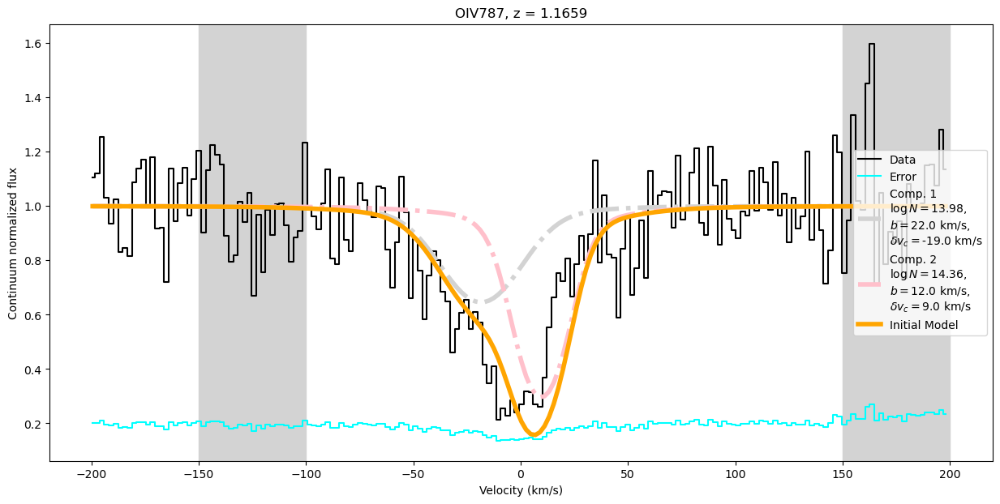

In [76]:
fig, ax = plt.subplots(1, figsize=(15, 7))

oiv_787_fuv.plot_init_profile(ax, legend=True)

In [77]:
#oiv_787_fuv.fit_multi_voigt()

oiv_787_fuv.fit_multi_voigt(lower_bounds = {(0,0):13.75, (0,1):20., (0,2):-30.,
                                   (1,0):14., (1,1):8., (1,2):0.},
           upper_bounds = {(0,0):14.2, (0,1):25., (0,2):-25.,
                                   (1,0):14.5, (1,1):12., (1,2):2.})

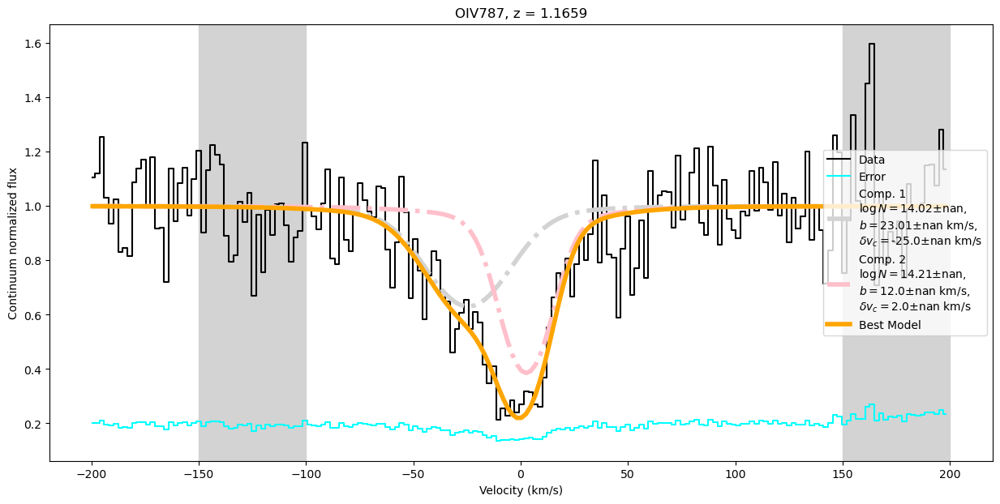

In [78]:
fig, ax = plt.subplots(1, figsize=(15, 7))

oiv_787_fuv.plot_best_profile(ax, legend=True)

Compile the OIV ion

In [79]:
oiv = ion(1.1659, 'OIV_sankar', [oiv_553_fuv, oiv_554_fuv, oiv_608_fuv, oiv_787_fuv])
#oiv = ion(1.1659, 'OIV', [oiv_553_fuv, oiv_608_fuv, oiv_787_fuv])

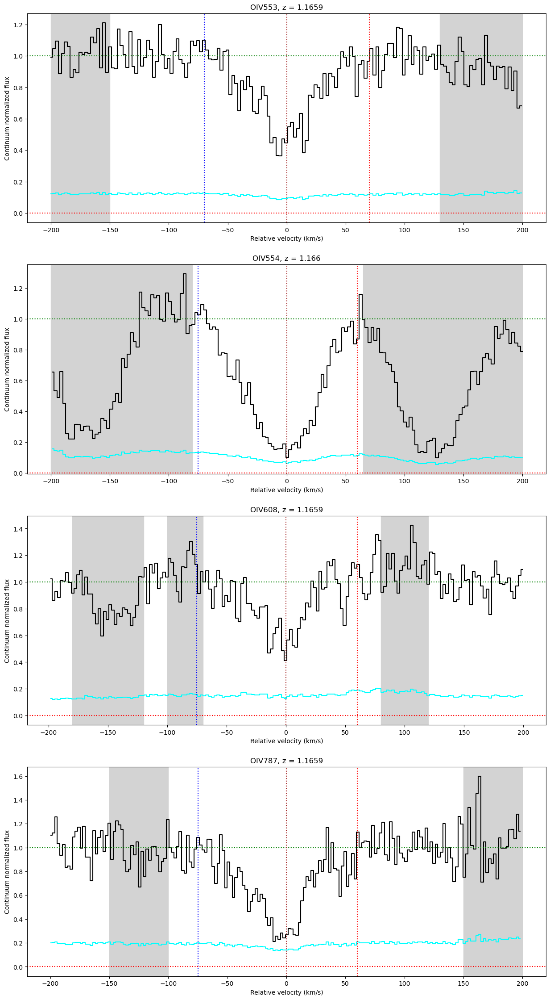

In [80]:
fig, axes = plt.subplots(4, 1, figsize=(15,28))

oiv.plot_ion(axes, draw_cont=True)

In [81]:
oiv.init_ion(np.array([[13.98, 22, -30], [14.36, 10, 0]]))

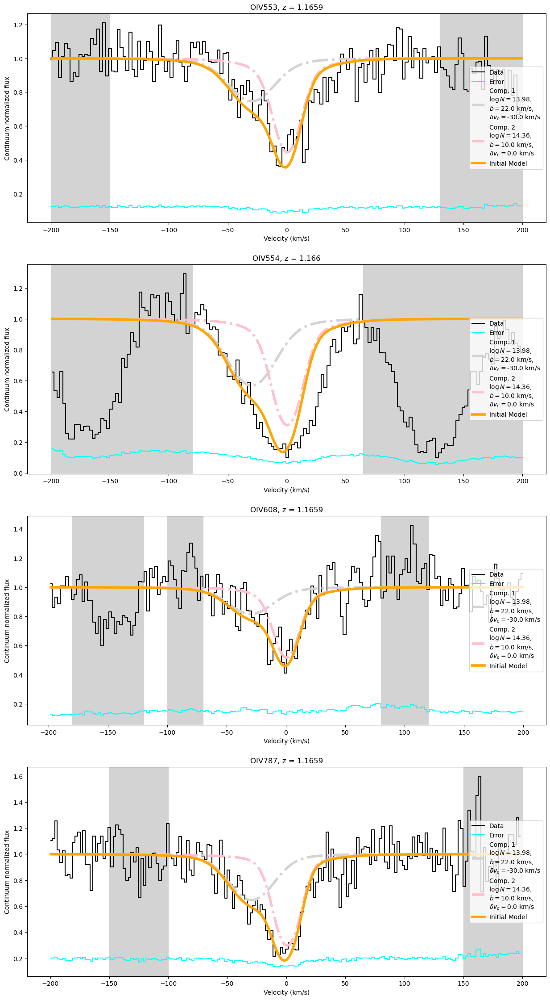

In [82]:
fig, axes = plt.subplots(4, 1, figsize=(15,28))

oiv.plot_ion_init_fit(axes, legend=True)

In [84]:
#oiv.fit_ion()

#oiv.fit_ion(lower_bounds_shared = {(0,1):20,
#                                   (1,1):8},
#           upper_bounds_shared = {(0,1):25,
#                                   (1,1):12})

oiv.fit_ion(lower_bounds_shared = {(0,0):13.75, (0,1):20, (0,2):-30,
                                   (1,0):14, (1,1):8, (1,2):0},
           upper_bounds_shared = {(0,0):14.2, (0,1):25, (0,2):-25,
                                   (1,0):14.5, (1,1):12, (1,2):2})

#oiv.fit_ion(lower_bounds_shared = {(0,0):13.75, (0,1):13, (0,2):-35,
#                                   (1,0):13.5, (1,1):4, (1,2):-5},
#           upper_bounds_shared = {(0,0):14.2, (0,1):30, (0,2):-10,
#                                   (1,0):14.5, (1,1):30, (1,2):10})

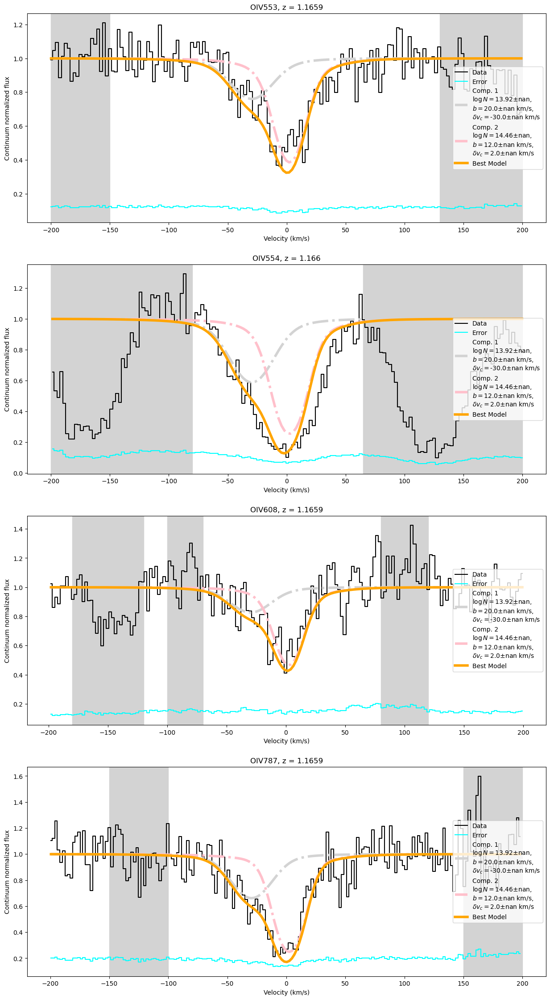

In [85]:
fig, axes = plt.subplots(4, 1, figsize=(15,28))

oiv.plot_ion_best_fit(axes, legend=True)

In [86]:
#oiv.fit_ion_emcee(loaddir=rootdir, n_steps=3000)
oiv.fit_ion_emcee(load=True, loaddir=rootdir)

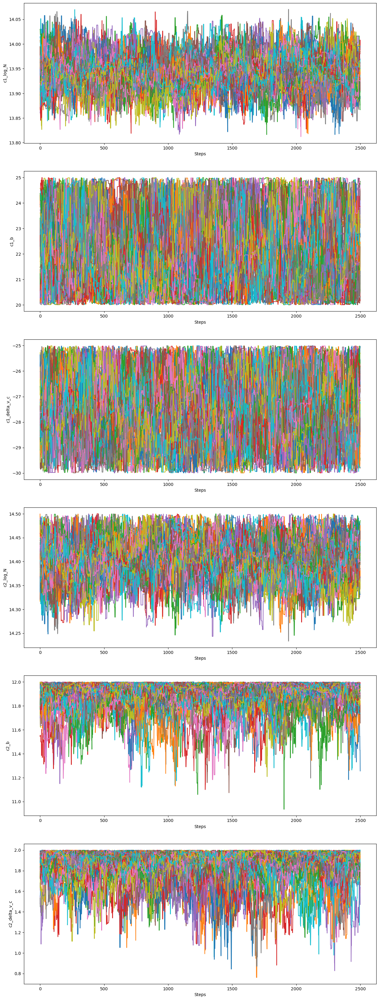

In [87]:
fig, axes = plt.subplots(6, 1, figsize=(15,7*6))

oiv.plot_chains(axes)

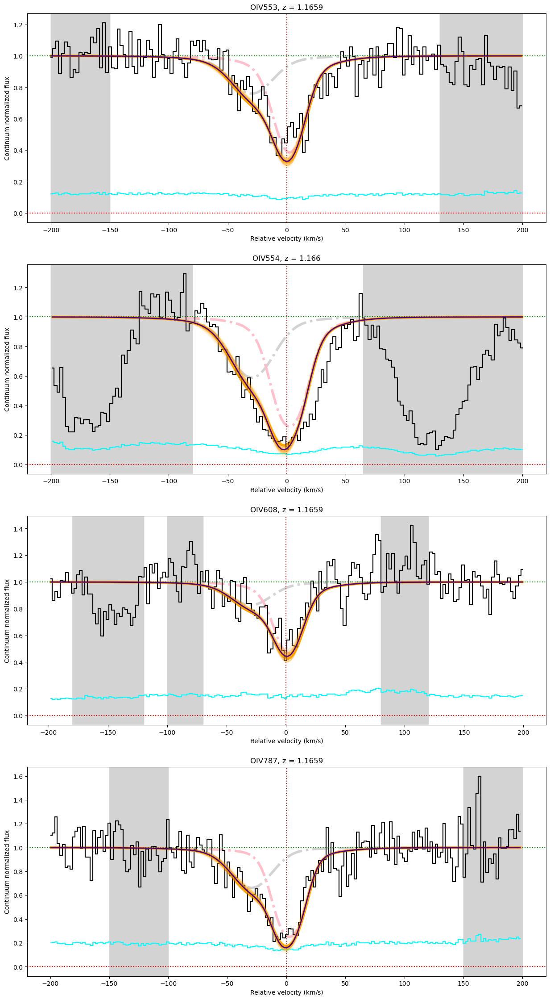

In [88]:
fig, axes = plt.subplots(4, 1, figsize=(15,28))

oiv.plot_ion_best_fit(axes)
oiv.plot_samples(axes)

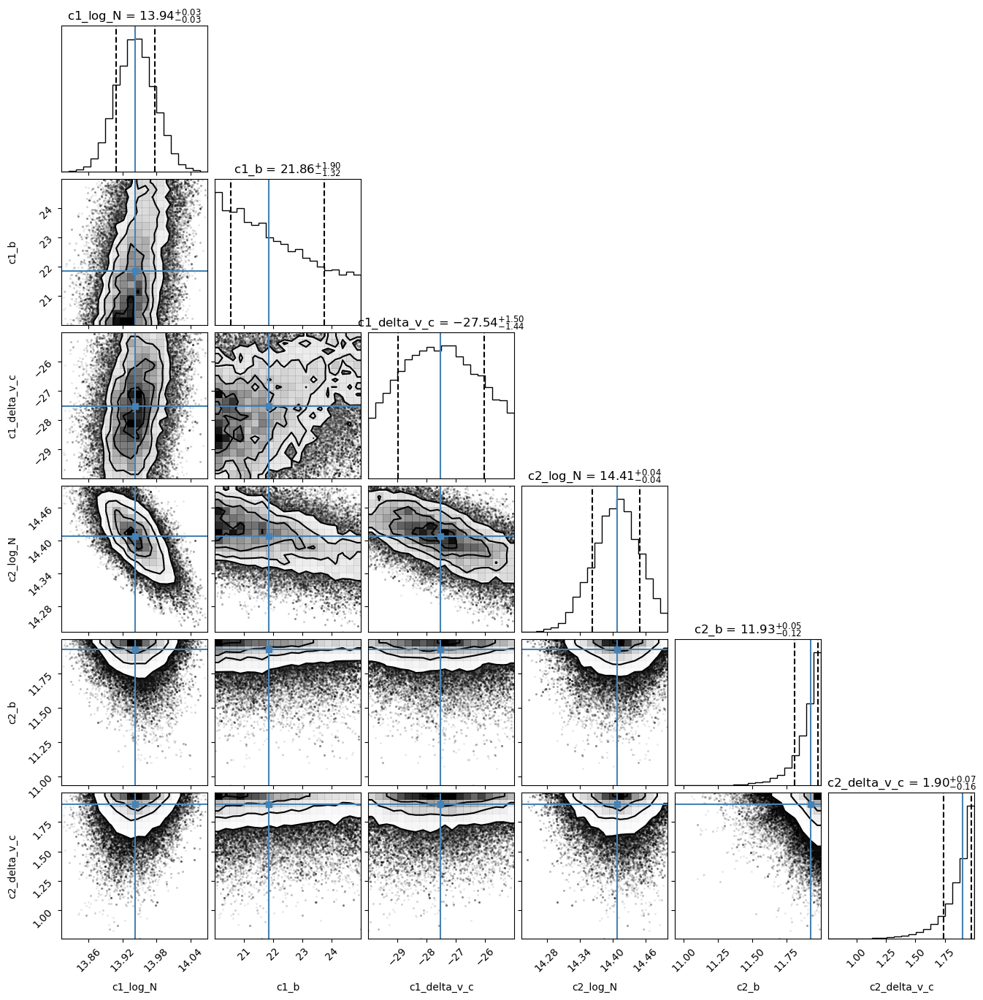

In [89]:
oiv.plot_corner()

# OV

Deal with OV 629

In [90]:
ov_629_fuv = ion_transition('OV629', 109, 'FUV')

In [91]:
ov_629_fuv.grab_ion_transition_info(ids_fits_list, atomic_data_table)

In [92]:
ov_629_fuv.grab_ion_transition_spec(spec_fits_list, v_range=[-200,200])

In [93]:
ov_629_fuv.cont_norm_flux(nodes_fits_list, renorm=False, v_abs_range=[-75,60], degree=1)

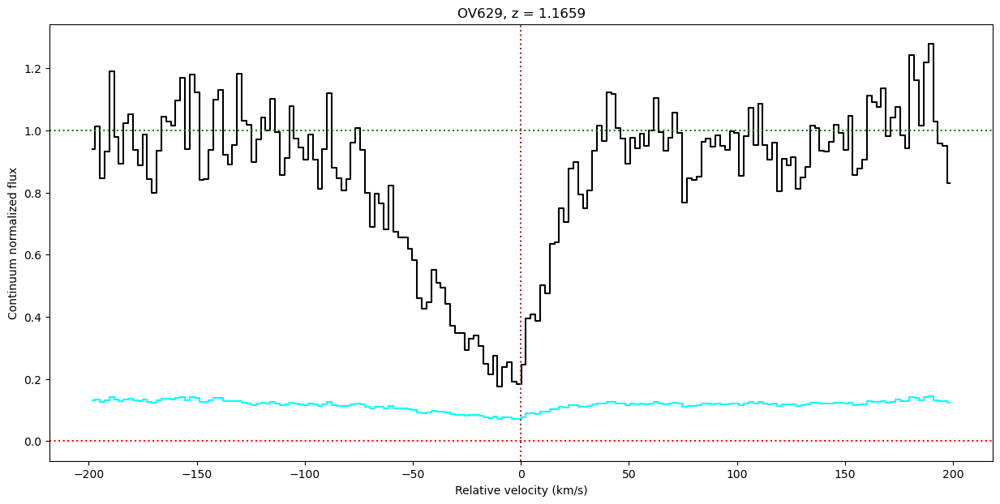

In [94]:
fig, ax = plt.subplots(1, figsize=(15,7))

ov_629_fuv.plot_ion_transition_spec(ax)

In [95]:
ov_629_fuv.grab_ion_transition_lsf(lsf_fits_list)

In [96]:
ov_629_fuv.init_multi_voigt(init_values = np.array([[13.67, 22, -27],
                                                     [13.94, 10 , 4]]), 
                             lsf_convolve = True)

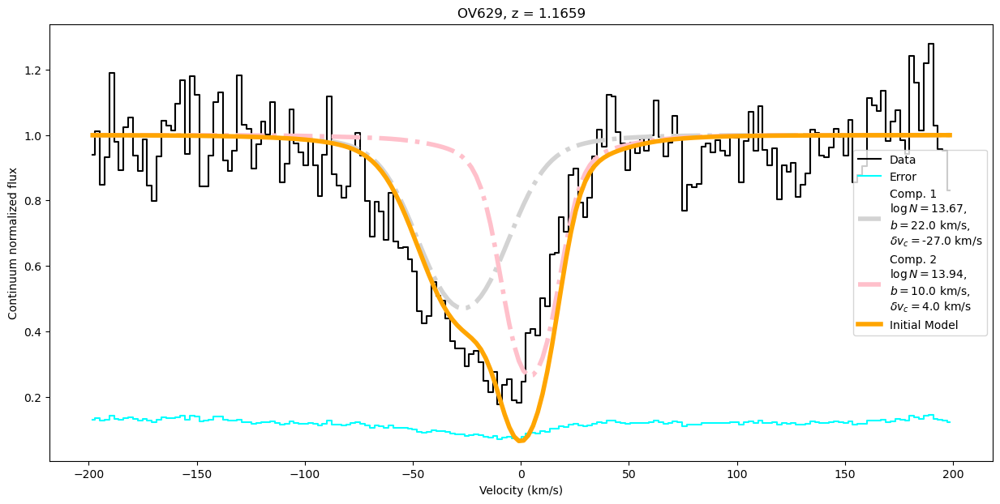

In [97]:
fig, ax = plt.subplots(1, figsize=(15, 7))

ov_629_fuv.plot_init_profile(ax, legend=True)

In [98]:
ov_629_fuv.fit_multi_voigt()

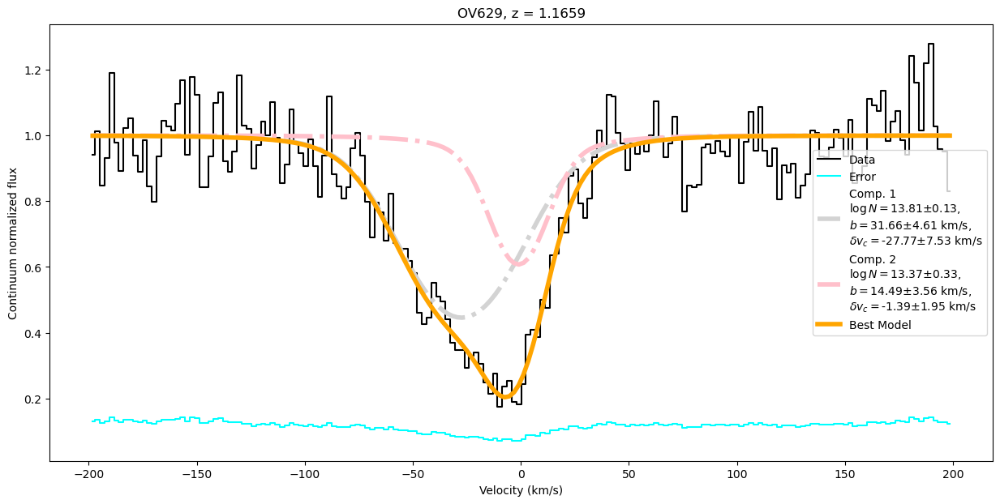

In [99]:
fig, ax = plt.subplots(1, figsize=(15, 7))

ov_629_fuv.plot_best_profile(ax, legend=True)

Make the OV ion

In [100]:
ov = ion(1.1659, 'OV_sankar', [ov_629_fuv])

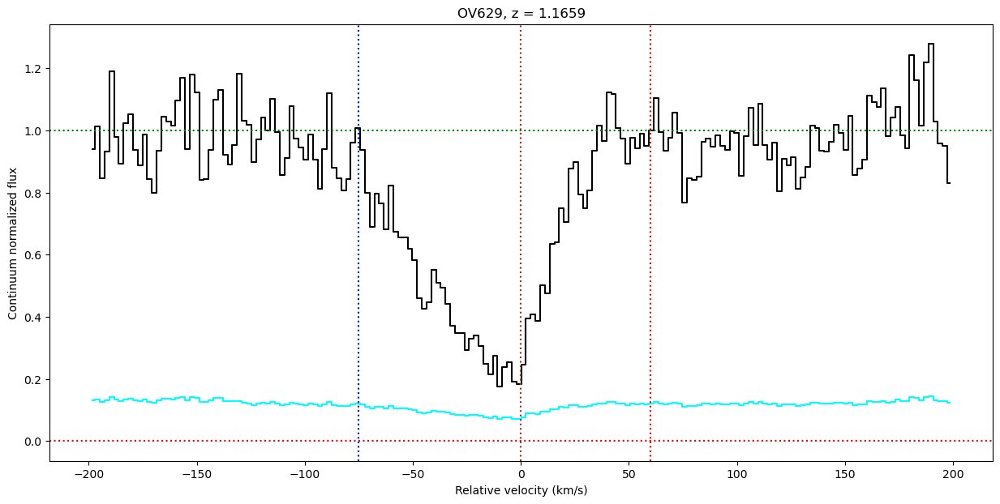

In [101]:
fig, axes = plt.subplots(1, 1, figsize=(15,7))

ov.plot_ion(axes, draw_cont=True)

In [102]:
ov.init_ion(np.array([[13.67, 22, -27],[13.94, 10 , 4]]))

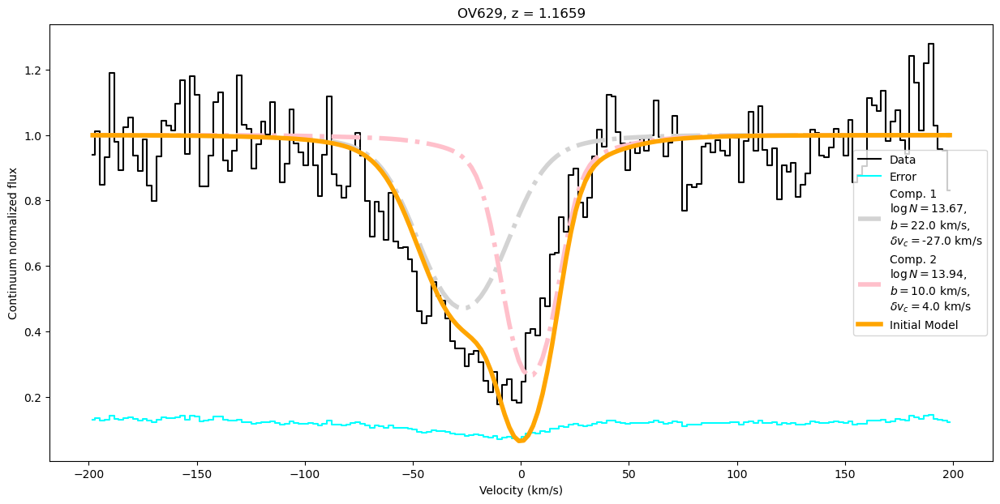

In [103]:
fig, axes = plt.subplots(1, 1, figsize=(15,7))

ov.plot_ion_init_fit(axes, legend=True)

In [104]:
ov.fit_ion()

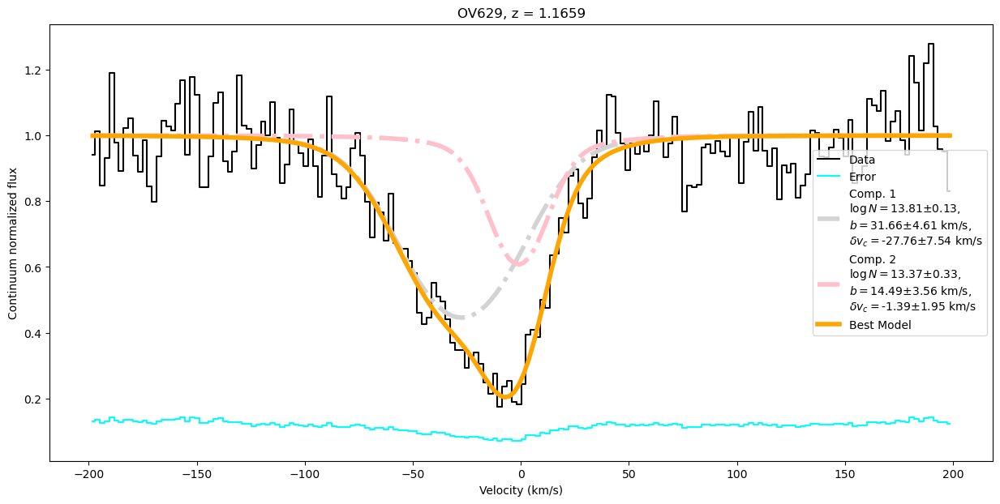

In [105]:
fig, axes = plt.subplots(1, 1, figsize=(15,7))

ov.plot_ion_best_fit(axes, legend=True)

In [106]:
#ov.fit_ion_emcee(loaddir=rootdir, n_steps=5000)
ov.fit_ion_emcee(load=True, loaddir=rootdir)

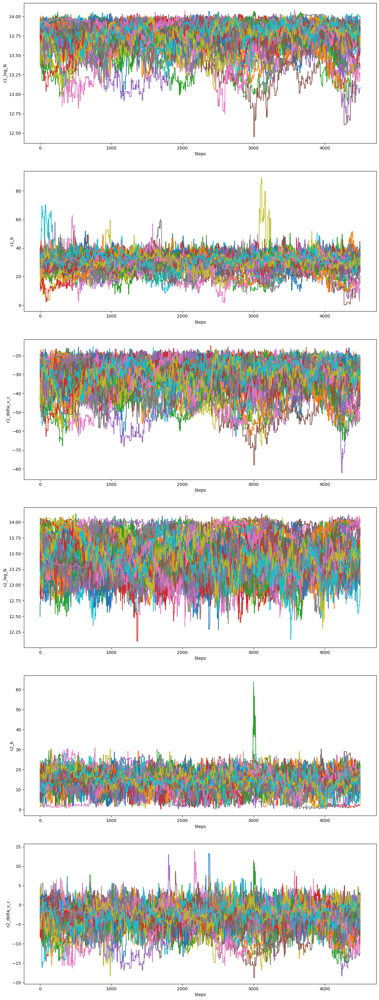

In [107]:
fig, axes = plt.subplots(6, 1, figsize=(15,7*6))

ov.plot_chains(axes)

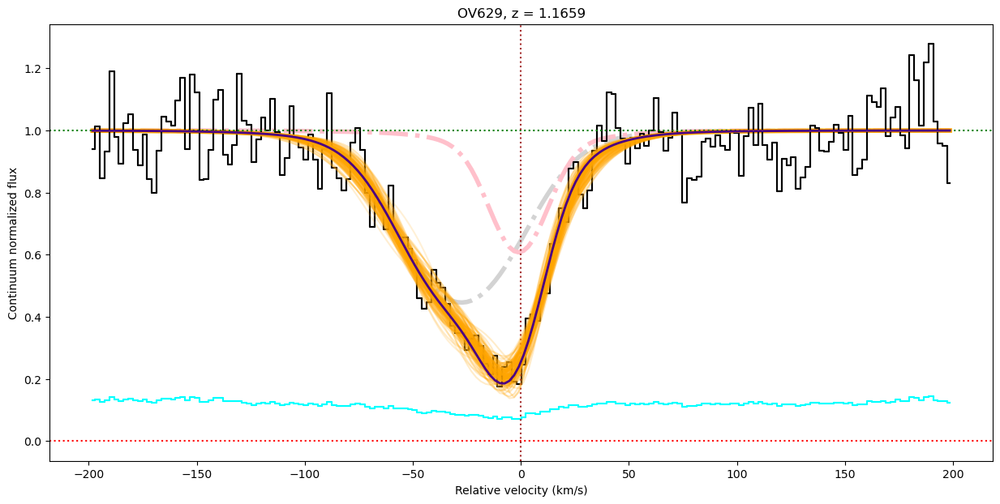

In [108]:
fig, axes = plt.subplots(1, 1, figsize=(15,7))

ov.plot_ion_best_fit(axes)
ov.plot_samples(axes)

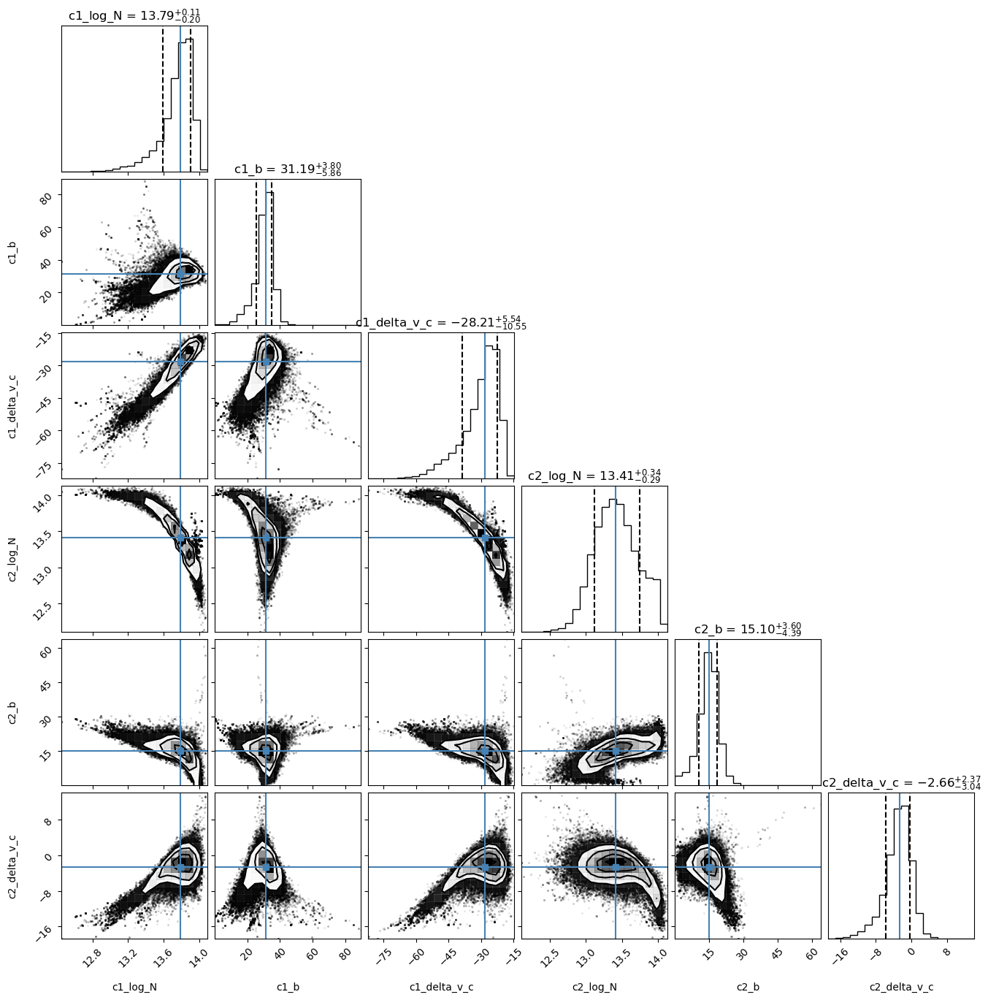

In [109]:
ov.plot_corner()

# OVI

First do OVI 1031 from STIS

In [110]:
ovi_1031_stis = ion_transition('OVI1031', 19, 'STIS')

In [111]:
ovi_1031_stis.grab_ion_transition_info(ids_fits_list, atomic_data_table, delta_v=-15)

In [112]:
ovi_1031_stis.grab_ion_transition_spec(spec_fits_list, v_range=[-200,200], masks=[[-200,-160],[110,200]])

In [113]:
ovi_1031_stis.cont_norm_flux(nodes_fits_list, renorm=True, v_abs_range=[-60,60], degree=1)

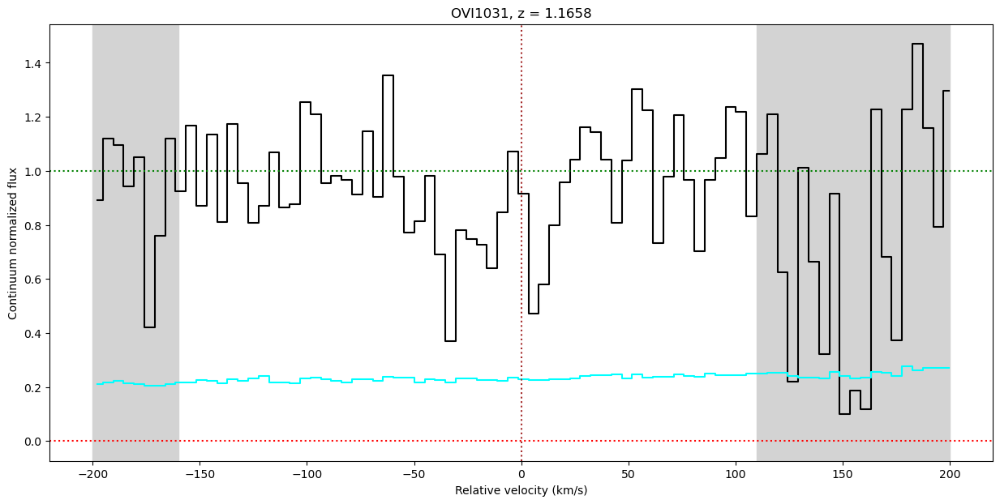

In [114]:
fig, ax = plt.subplots(1, figsize=(15,7))

ovi_1031_stis.plot_ion_transition_spec(ax)

In [115]:
ovi_1031_stis.grab_ion_transition_lsf(lsf_fits_list)

In [116]:
ovi_1031_stis.init_multi_voigt(init_values = np.array([[13.78, 23, -27],
                                                     [13.61, 10, 4]]), 
                             lsf_convolve = True)

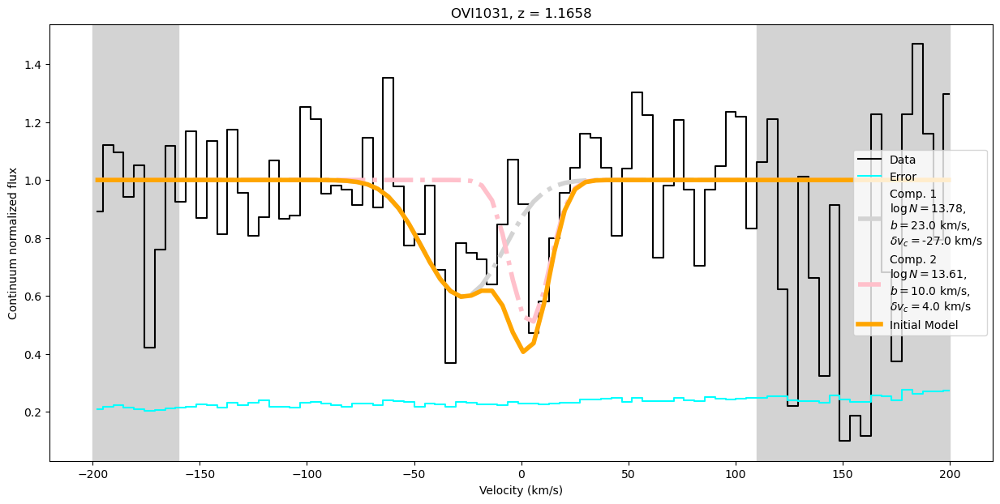

In [117]:
fig, ax = plt.subplots(1, figsize=(15, 7))

ovi_1031_stis.plot_init_profile(ax, legend=True)

In [118]:
ovi_1031_stis.fit_multi_voigt(lower_bounds = {(0,0):13.7, (0,1):20., (0,2):-30,
                                   (1,0):13.5, (1,1):8, (1,2):0},
           upper_bounds = {(0,0):14., (0,1):25., (0,2):-25,
                                   (1,0):13.7, (1,1):12, (1,2):4})

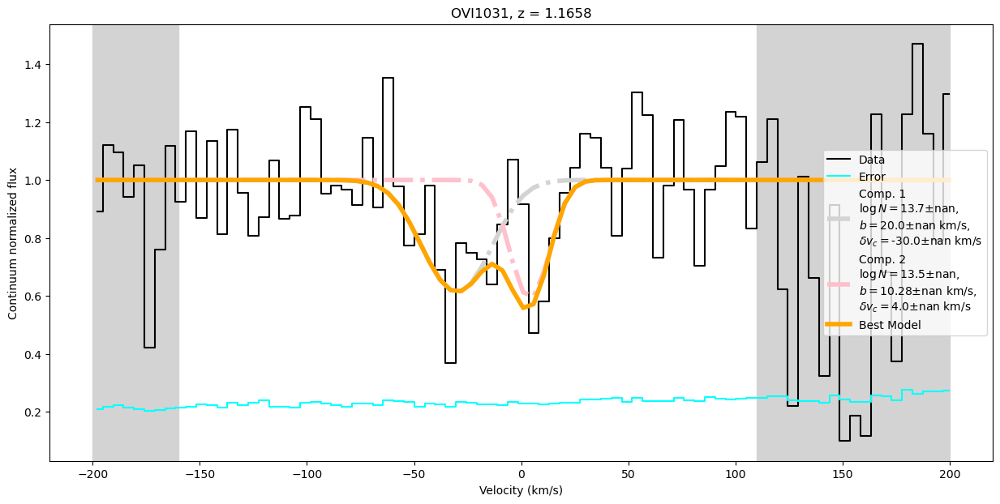

In [119]:
fig, ax = plt.subplots(1, figsize=(15, 7))

ovi_1031_stis.plot_best_profile(ax, legend=True)

Then do OVI 1037

In [120]:
ovi_1037_stis = ion_transition('OVI1037', 19, 'STIS')

In [121]:
ovi_1037_stis.grab_ion_transition_info(ids_fits_list, atomic_data_table)

In [122]:
ovi_1037_stis.grab_ion_transition_spec(spec_fits_list, v_range=[-200,200], masks=[[-200,-160],
                                                                                 [-130,-110],
                                                                                 [40,70],
                                                                                 [110,200]])

In [123]:
ovi_1037_stis.cont_norm_flux(nodes_fits_list, renorm=False, v_abs_range=[-60,40], degree=1)

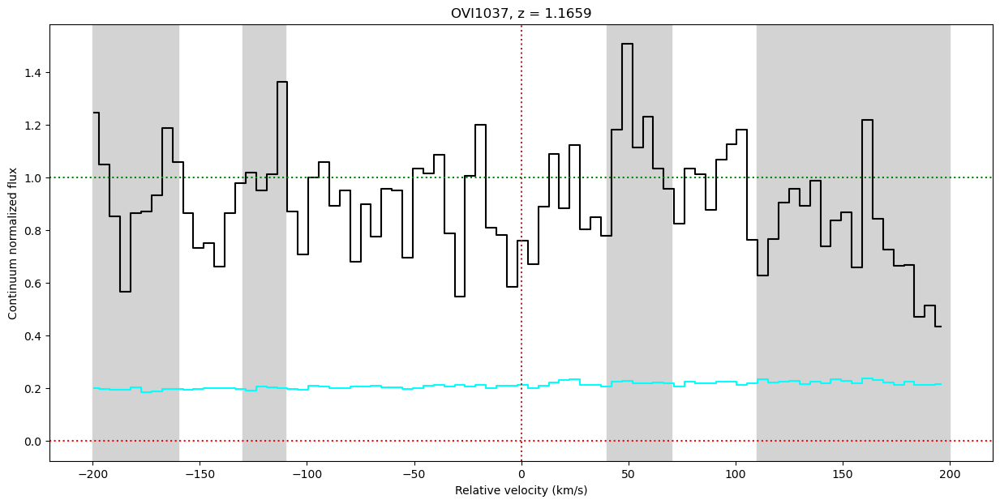

In [124]:
fig, ax = plt.subplots(1, figsize=(15,7))

ovi_1037_stis.plot_ion_transition_spec(ax)

In [125]:
ovi_1037_stis.grab_ion_transition_lsf(lsf_fits_list)

In [126]:
ovi_1037_stis.init_multi_voigt(init_values = np.array([[13.78, 23, -27],
                                                     [13.61, 10, 4]]), 
                             lsf_convolve = True)

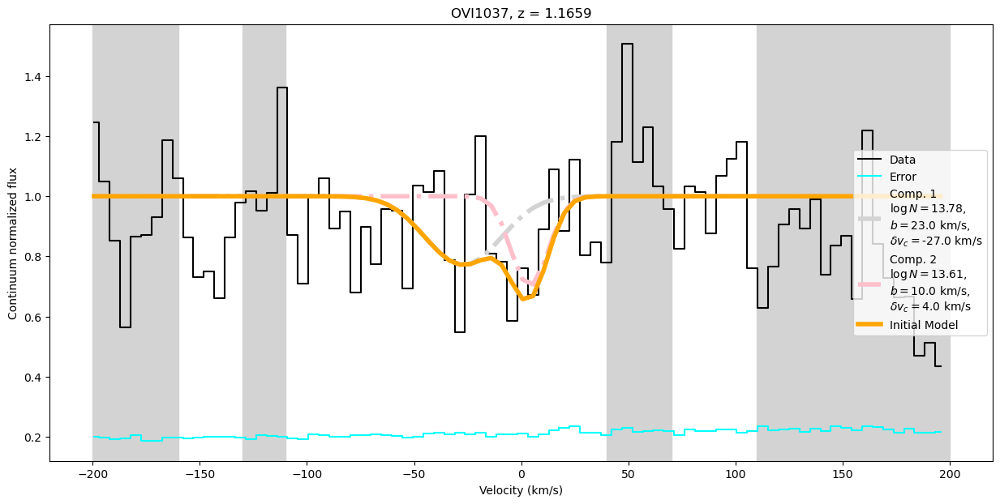

In [127]:
fig, ax = plt.subplots(1, figsize=(15, 7))

ovi_1037_stis.plot_init_profile(ax, legend=True)

In [128]:
ovi_1037_stis.fit_multi_voigt(lower_bounds = {(0,0):13.7, (0,1):20., (0,2):-30,
                                   (1,0):13.5, (1,1):8, (1,2):0},
           upper_bounds = {(0,0):14., (0,1):25., (0,2):-25,
                                   (1,0):13.7, (1,1):12, (1,2):4})

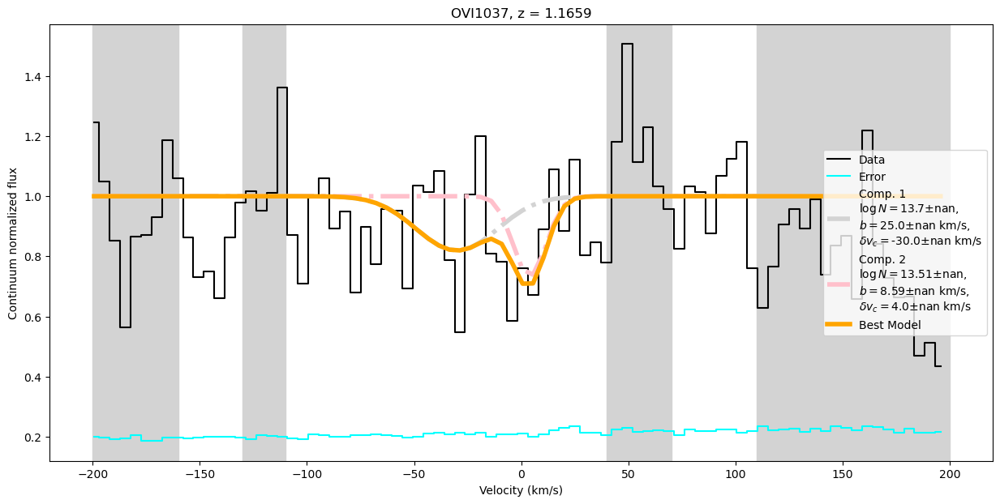

In [129]:
fig, ax = plt.subplots(1, figsize=(15, 7))

ovi_1037_stis.plot_best_profile(ax, legend=True)

Now compile the OVI ion

In [130]:
ovi = ion(1.1659, 'OVI_sankar', [ovi_1031_stis, ovi_1037_stis])

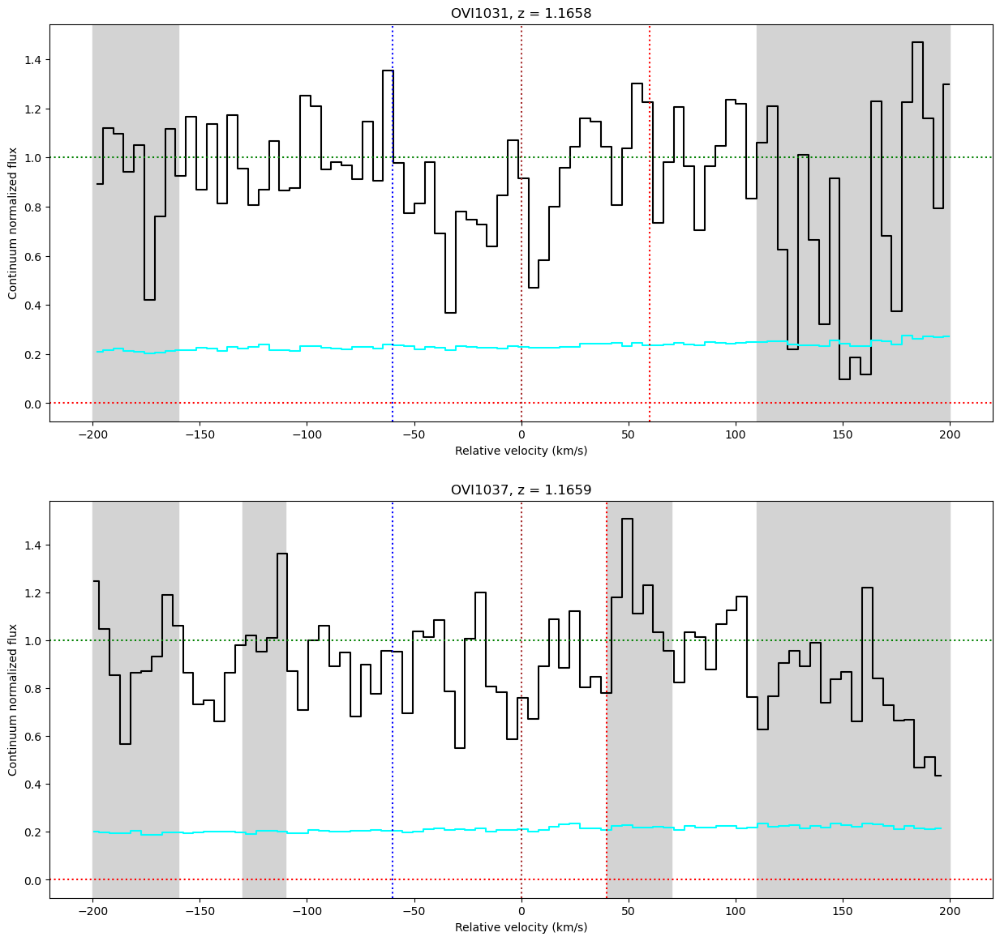

In [131]:
fig, axes = plt.subplots(2, 1, figsize=(15,14))

ovi.plot_ion(axes, draw_cont=True)

In [132]:
ovi.init_ion(np.array(np.array([[13.78, 23, -27],[13.61, 10, 4]])))

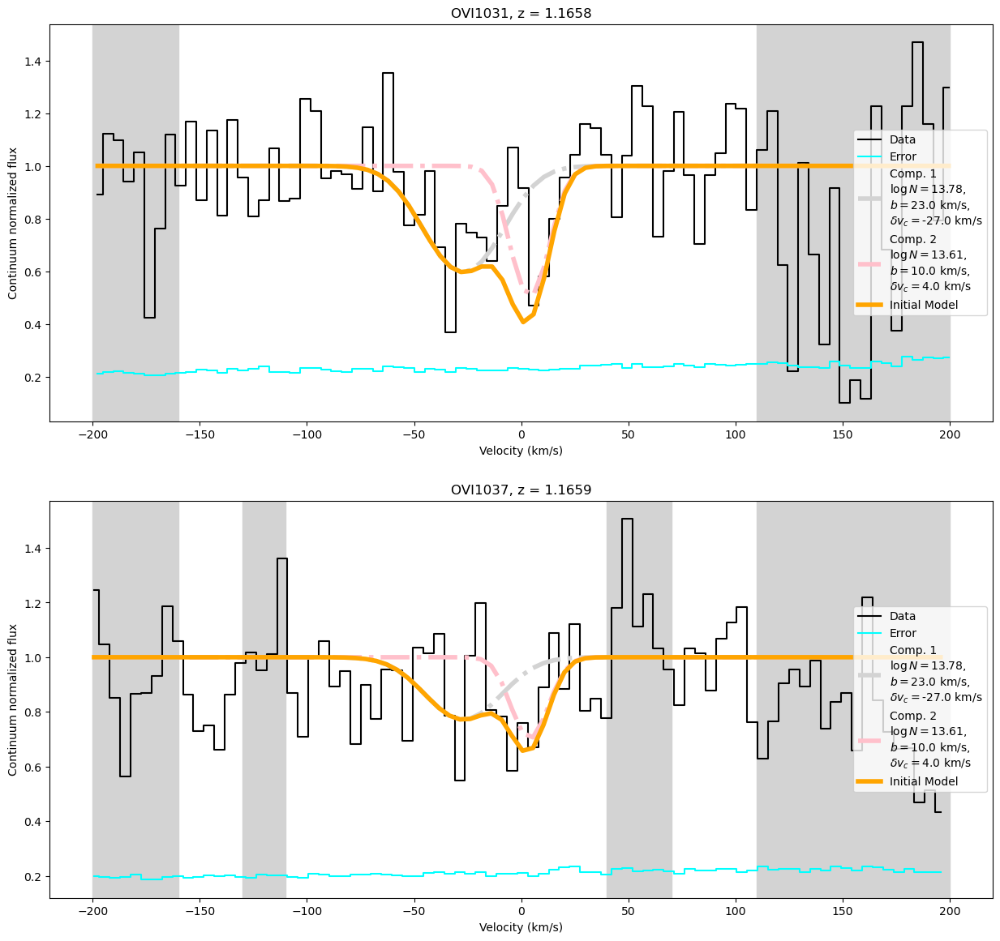

In [133]:
fig, axes = plt.subplots(2, 1, figsize=(15,14))

ovi.plot_ion_init_fit(axes, legend=True)

In [134]:
ovi.fit_ion(lower_bounds_shared = {(0,0):13.75, (0,1):21., (0,2):-29,
                                   (1,0):13.55, (1,1):8, (1,2):2},
           upper_bounds_shared = {(0,0):14., (0,1):25., (0,2):-25,
                                   (1,0):13.65, (1,1):12, (1,2):6})

In [135]:
ovi.result

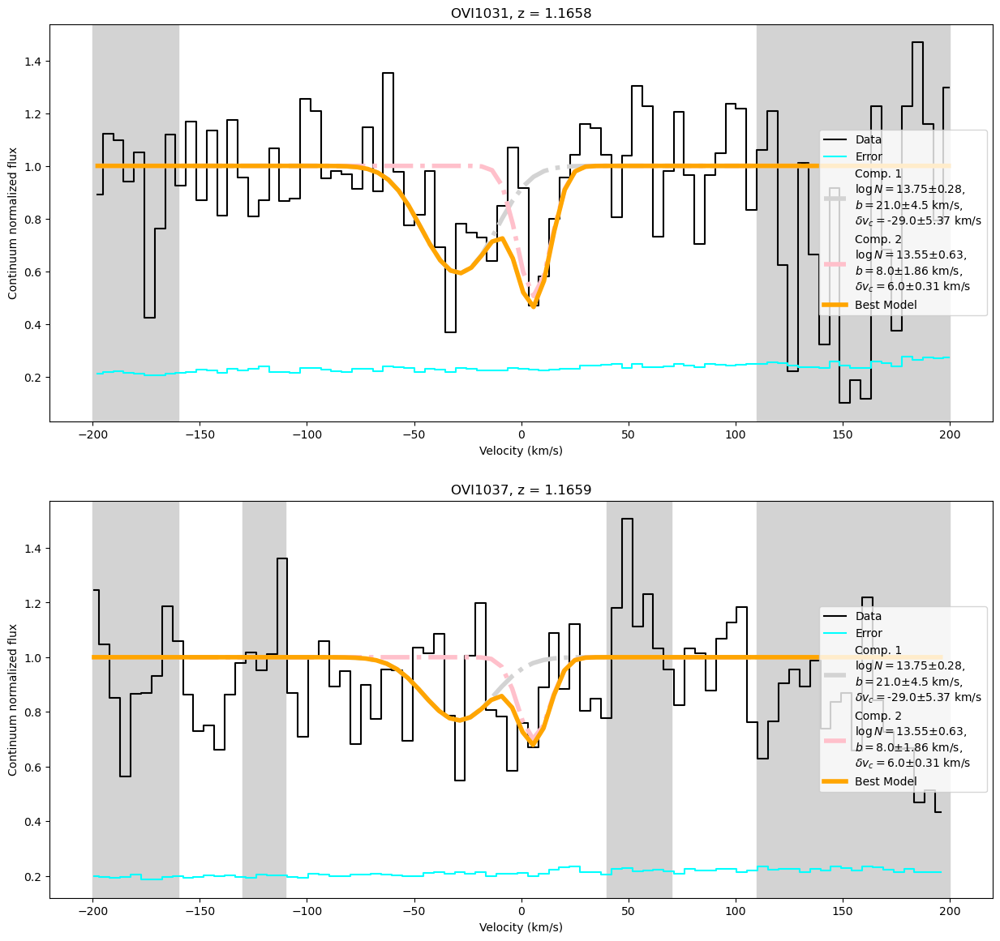

In [136]:
fig, axes = plt.subplots(2, 1, figsize=(15,14))

ovi.plot_ion_best_fit(axes, legend=True)

In [138]:
#ovi.fit_ion_emcee(loaddir=rootdir, scale_covar=1e-4, n_steps=5000)
ovi.fit_ion_emcee(load=True, loaddir=rootdir)

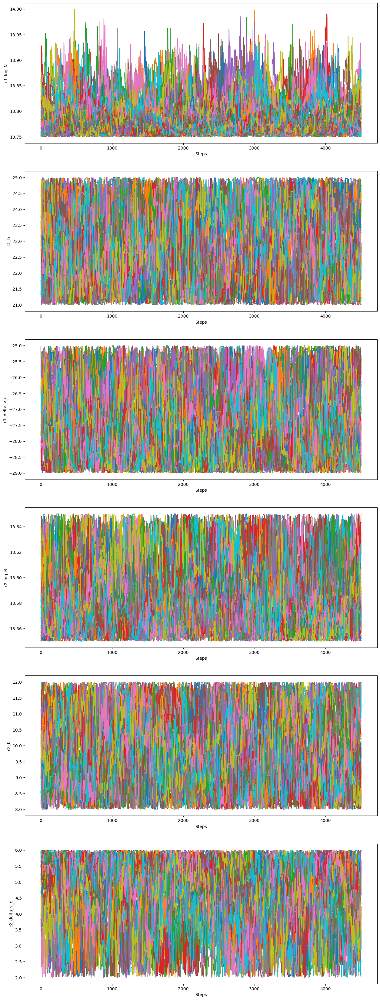

In [139]:
fig, axes = plt.subplots(6, 1, figsize=(15,7*6))

ovi.plot_chains(axes)

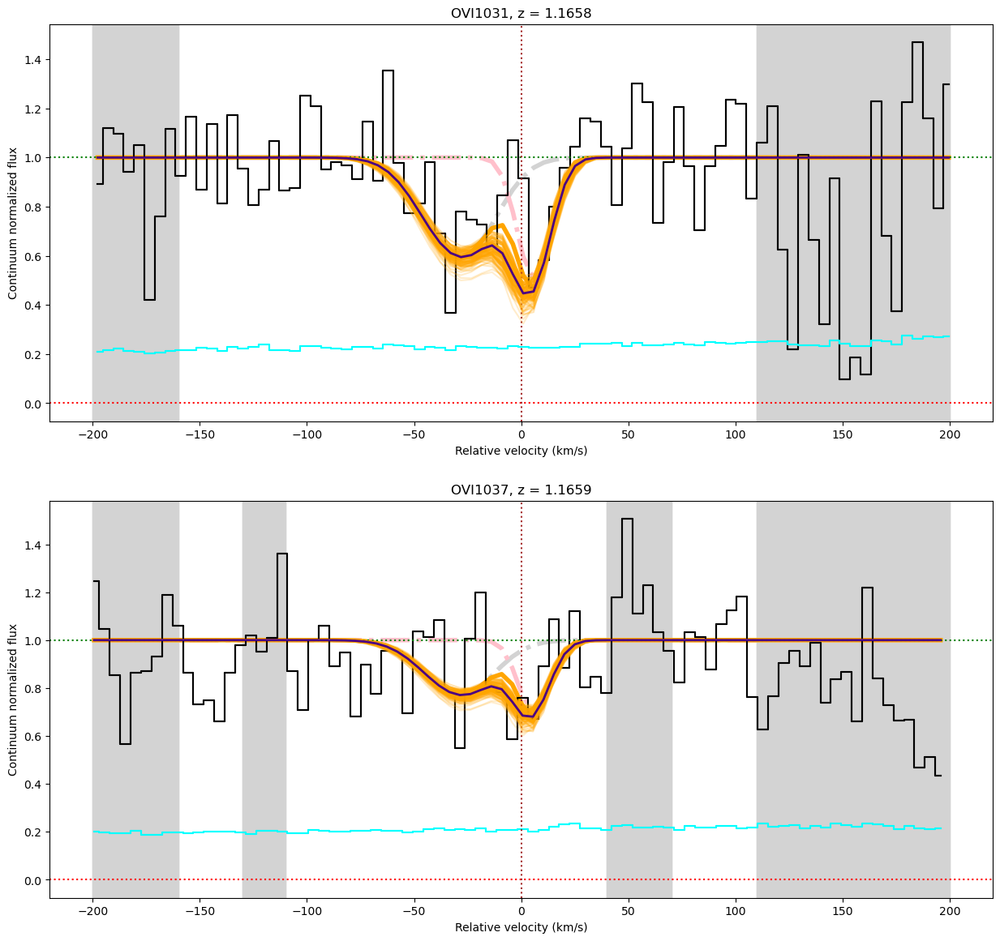

In [140]:
fig, axes = plt.subplots(2, 1, figsize=(15,14))

ovi.plot_ion_best_fit(axes)
ovi.plot_samples(axes)

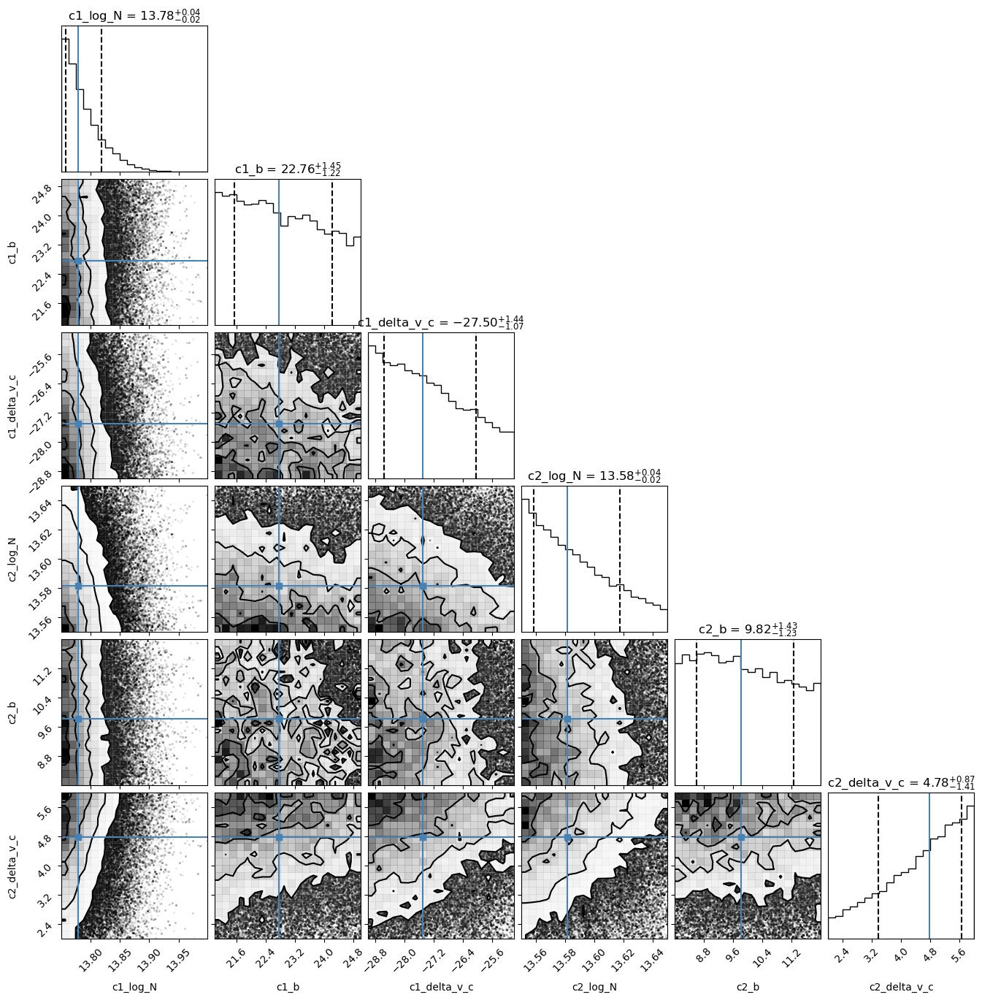

In [141]:
ovi.plot_corner()